# <span style='color:#0D2BA5'>5 - Segmentez des clients d'un site e-commerce: Essais </span>
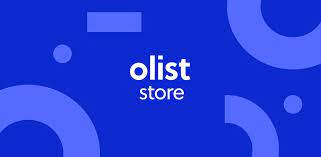

## <span style='background:#33B5FF'>Table des Matieres</span>

In [155]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## <span style='background:#33B5FF'>1. Introduction</span>

**Mission**
*****
Vous êtes consultant pour Olist, une entreprise brésilienne qui propose une solution de vente sur les marketplaces en ligne.Olist souhaite que vous fournissiez à ses équipes d'e-commerce une segmentation des clients qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.
Votre objectif est de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.
Vous devrez fournir à l’équipe Marketing une description actionable de votre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu’une proposition de contrat de maintenance basée sur une analyse de la stabilité des segments au cours du temps.




**Source**
*****
Le jeux de donnée est disponible à l'adresse : [Olist Data](https://www.kaggle.com/olistbr/brazilian-ecommerce)
*****



**Axes d'orientations**
*****

Nous allons :
- Réaliser une courte analyse exploratoire.
- Utilisez  des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.
- Différencier les bons et moins bons clients en termes de commandes et de satisfaction.
- Mettre en place une recommandation de fréquence à laquelle la segmentation doit être mise à jour pour rester pertinente, afin de pouvoir effectuer un devis de contrat de maintenance.
- Respecter la convention PEP8 pour le code.
- **Conclusions**


## <span style='background:#33B5FF'>2. Bibliotheques d'analyses de python</span>

In [156]:
# Chargement des librairies
import folium
import datetime
from datetime import timedelta
import jyquickhelper
import json
import time
from math import pi

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import sys

import plotly.express as px
import plotly.graph_objects as go
import plotly

plotly.offline.init_notebook_mode()


from sklearn.preprocessing import PowerTransformer, StandardScaler, \
    MinMaxScaler

from sklearn.metrics import davies_bouldin_score, silhouette_score, \
    calinski_harabasz_score

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer



from lightgbm import LGBMClassifier
import shap
from sklearn.model_selection import cross_val_score

# Warnings
import warnings
warnings.filterwarnings('ignore')



from umap import UMAP

%matplotlib inline
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
%pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('plotly                : ' + plotly.__version__)
print('folium                : ' + folium.__version__)
print('jyquickhelper         : ' + jyquickhelper.__version__)
#now = datetime.now().isoformat()
#print('Lancé le           : ' + now)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The pycodestyle_magic extension is already loaded. To reload it, use:
  %reload_ext pycodestyle_magic
Version des librairies utilisées :
Python                : 3.11.3 (main, Apr  7 2023, 19:25:52) [Clang 14.0.0 (clang-1400.0.29.202)]
NumPy                 : 1.24.3
Pandas                : 2.0.1
Matplotlib            : 3.7.1
Seaborn               : 0.12.2
plotly                : 5.14.1
folium                : 0.14.0
jyquickhelper         : 0.4.220


## <span style='background:#33B5FF'>3. Segmentation RFM</span>

### <span style='background:'>3.1 Ségmentation avec la methode des quartiles</span>


In [240]:
# Chargement des données Clients
data = pd.read_csv('df_client_nettoyé.csv')
data.set_index('customer_unique_id', inplace=True)
# Copie des données
data_clients = data.copy()

In [241]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data_clients.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 78597 lignes et 16 variables.


In [242]:
# Contenu des 3 premieres lignes
data_clients.head(3)

,customer_city,customer_state,geolocation_lat,geolocation_lng,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,date_dernier_achat,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,moyen_paiement,cat_produit_prefere
customer_unique_id,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,-23.335331,-46.828647,112.0,1.0,141.90,5.0,2018-05-10 10:56:27,1,1.0,129.9,8.0,12.00,credit_card,cama_mesa_banho
0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,-23.567395,-46.792957,115.0,1.0,27.19,4.0,2018-05-07 11:11:27,1,1.0,18.9,1.0,8.29,credit_card,beleza_saude
0000f46a3911fa3c0805444483337064,sao jose,SC,-27.543787,-48.625680,537.0,1.0,86.22,3.0,2017-03-10 21:05:03,1,1.0,69.0,8.0,17.22,credit_card,papelaria


In [243]:
# Création du datframe de segmentation RFM
df_segm_rfm = data_clients.copy()

In [244]:
df_segm_rfm = data_clients[['rfm_recence','rfm_frequence','rfm_montant']]
df_segm_rfm.sort_index()
df_segm_rfm.head()

,rfm_recence,rfm_frequence,rfm_montant
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,112.0,1.0,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,1.0,27.19
0000f46a3911fa3c0805444483337064,537.0,1.0,86.22
0004aac84e0df4da2b147fca70cf8255,288.0,1.0,196.89
0004bd2a26a76fe21f786e4fbd80607f,146.0,1.0,166.98


In [245]:
# Utilisation de la méthode des quantiles
df_quantiles = df_segm_rfm.quantile(q=[0.25, 0.5, 0.75])
# Transformation en dictionnaire plus facile à utiliser
df_quantiles = df_quantiles.to_dict()

In [246]:
def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1  # > 0.75

def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4  # > 0.75


In [247]:
# Assignation des bins aux variables R, F, M
# ------------------------------------------------------------------------
df_segm_rfm['R'] = df_segm_rfm['rfm_recence'] \
    .apply(RScore, args=('rfm_recence',
                                              df_quantiles))
df_segm_rfm['F'] = df_segm_rfm['rfm_frequence']. \
    apply(FMScore, args=('rfm_frequence',
                                              df_quantiles))
df_segm_rfm['M'] = df_segm_rfm['rfm_montant'] \
    .apply(FMScore, args=('rfm_montant',
                                               df_quantiles))

### <span style='background:'>3.2 Score RFM</span>


In [248]:
# Concaténation des groupes R, F et M ==> segment du client
# ------------------------------------------------------------------------
df_segm_rfm['RFM_Segment'] = df_segm_rfm.apply(lambda x: str(x['R']) +
                                               str(x['F']) + str(x['M']),
                                               axis=1)

In [249]:
# Calcul du score
# ------------------------------------------------------------------------
df_segm_rfm['RFM_Score'] = df_segm_rfm[['R','F','M']].sum(axis=1)

In [250]:
df_segm_rfm['RFM_Segment']= df_segm_rfm['RFM_Segment'].str.extract(r'(.*.*.*))', expand=False)
df_segm_rfm['RFM_Segment'].unique()

array([nan], dtype=object)

In [142]:
# Calcul de la moyenne de chacune des variables RFM par RFM_Score
# ------------------------------------------------------------------------
#%pycodestyle_off
df_segm_rfm_agg = df_segm_rfm.groupby('RFM_Score').agg({
    'rfm_recence' : 'mean',
    'rfm_frequence' : 'mean',
    'rfm_montant' : ['mean', 'count']
})
display(df_segm_rfm_agg)
#%pycodestyle_on


rfm_recence rfm_frequence rfm_montant       
                 mean          mean        mean  count
RFM_Score                                             
3          452.223246      1.000000   39.821024   4990
4          361.794358      1.000000   60.079102   9784
5          292.784607      1.000000   83.113692  14513
6          231.946815      1.001116  152.782020  18821
7          163.860496      1.005035  187.776809  14100
8          113.497364      1.022537  241.264773   9673
9           85.836396      1.101446  366.705156   5116
10         223.441739      2.088696  302.653061    575
11         135.777202      2.119171  310.441140    579
12          58.450673      2.204036  421.056278    446

### <span style='background:'>3.3 Classement des clients par Score RFM</span>


In [131]:
# Ajout d'une variable RFM de classement du type de client
# ---------------------------------------------------------------------
score_1 = ['444']
score_2 = ['331', '332', '333', '334', '341', '342', '343', '431',
           '432', '433', '434', '441', '442', '443']
score_3 = ['313', '314', '323', '324', '413', '414', '423', '424','411','321', '322', '412', '421', '422']

score_4 = ['121', '122', '123', '124', '131', '132', '223', '224',
           '231', '232','211', '212', '213', '214', '221', '223', '311', '312']

score_5 = ['133', '134', '143', '233', '234', '241', '242', '243','344','244','141', '142']
score_6 = ['144','111', '112', '113', '114']

df_segm_rfm['RFM_Segm_Client'] = ['Champions'
                                  if row in score_1
                                  else 'Client fidèle'
                                  if row in score_2
                                  else 'Fidélisation potentielle'
                                  if row in score_3
                                  else 'A Réactiver'
                                  if row in score_4
                                  else 'A Risque'
                                  if row in score_5
                                  else 'Perdus'
                                  if row in score_6
                                  else 'Autres'
                                  for row in df_segm_rfm['RFM_Segment']]

In [132]:
df_segm_rfm['RFM_Segm_Client'].unique().tolist()

['Autres']

In [151]:
df_segm_rfm.reset_index().head()

,index,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM_Score,RFM_Segm_Client
0,0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,1.0,141.90,4,1,3,413,8,Fidélisation potentielle
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,1.0,27.19,3,1,1,311,5,A Réactiver
2,2,0000f46a3911fa3c0805444483337064,537.0,1.0,86.22,1,1,2,112,4,Perdus
3,3,0004aac84e0df4da2b147fca70cf8255,288.0,1.0,196.89,2,1,4,214,7,A Réactiver
4,4,0004bd2a26a76fe21f786e4fbd80607f,146.0,1.0,166.98,3,1,3,313,7,Fidélisation potentielle


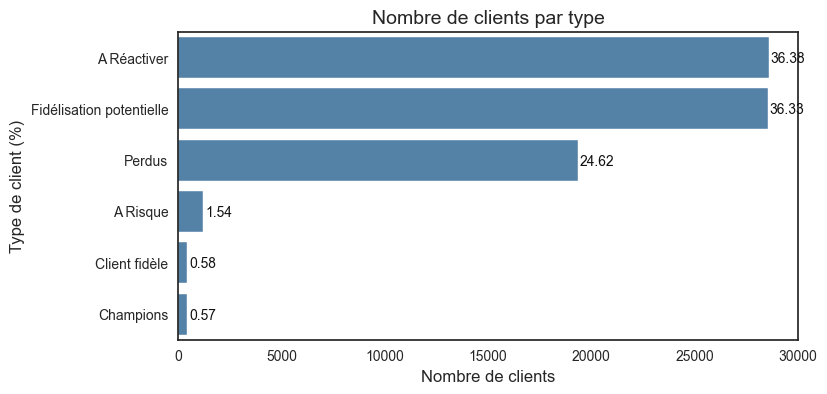

In [152]:
# Répartition des clients dans les différents types
# ---------------------------------------------------------------------
ax1 = plt.gca()

# DataFrame de travail
nb_client = df_segm_rfm['RFM_Segm_Client'].shape[0]
series_type_client = df_segm_rfm['RFM_Segm_Client'].value_counts()
df_visu_type_client = pd.DataFrame(
    {'Type_client': series_type_client.index,
     'Nb_clients': series_type_client.values})
df_visu_type_client['%'] = round(
    (df_visu_type_client['Nb_clients'])*100/nb_client, 2)

# Barplot de la distribution
sns.set_style('white')
sns.barplot(y='Type_client', x='Nb_clients',
            data=df_visu_type_client, color='SteelBlue', ax=ax1)
ax1.set_ylabel('Type de client (%)', fontsize=12)
ax1.set_xlabel('Nombre de clients', fontsize=12)
ax1.set_title('Nombre de clients par type', fontsize=14)
for i, p in enumerate(ax1.patches):
    ax1.text(
        p.get_width() +
        p.get_x() + 100,
        p.get_height() +
        p.get_y() - 0.3,
        df_visu_type_client['%'][i],
        fontsize=10,
        color='k')
plt.gcf().set_size_inches(8, 4)
plt.show()

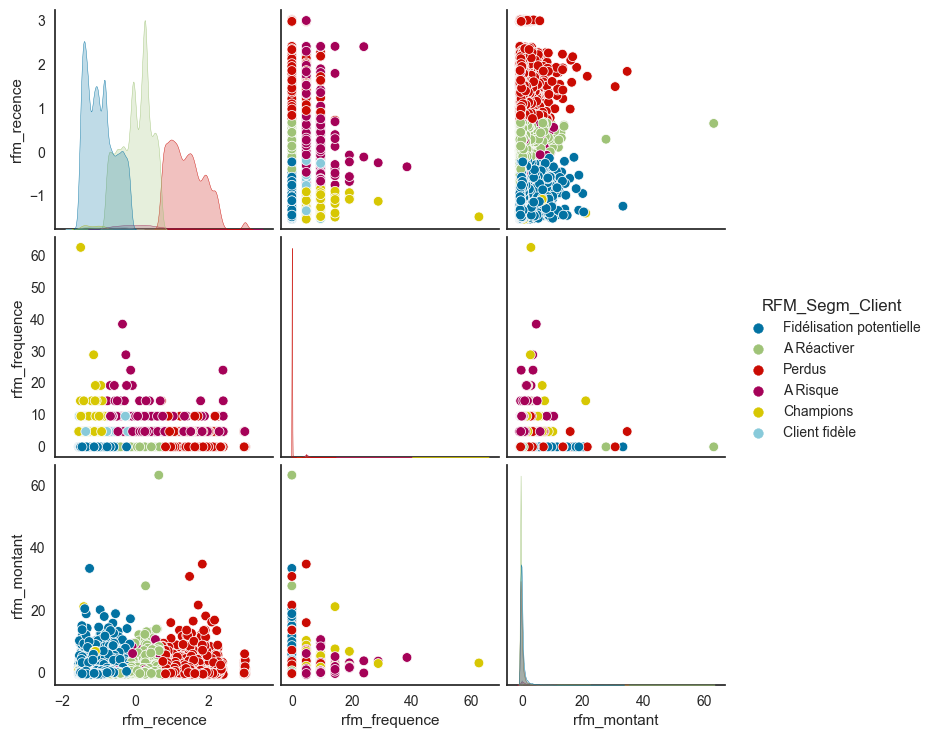

In [153]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_rfm_pairplot = df_segm_rfm.copy()

scaler = StandardScaler()
df_rfm_pairplot['rfm_recence'] = scaler.fit_transform(
    df_rfm_pairplot['rfm_recence'].values.reshape(-1, 1))
df_rfm_pairplot['rfm_frequence'] = scaler.fit_transform(
    df_rfm_pairplot['rfm_frequence'].values.reshape(-1, 1))
df_rfm_pairplot['rfm_montant'] = scaler.fit_transform(
    df_rfm_pairplot['rfm_montant'].values.reshape(-1, 1))

sns.set_style('white')
sns.pairplot(df_rfm_pairplot,
             vars=['rfm_recence', 'rfm_frequence', 'rfm_montant'],
             hue="RFM_Segm_Client")
plt.show()

In [155]:
df_segm_rfm.columns

Index(['customer_unique_id', 'rfm_recence', 'rfm_frequence', 'rfm_montant',
       'R', 'F', 'M', 'RFM_Segment', 'RFM_Score', 'RFM_Segm_Client'],
      dtype='object')

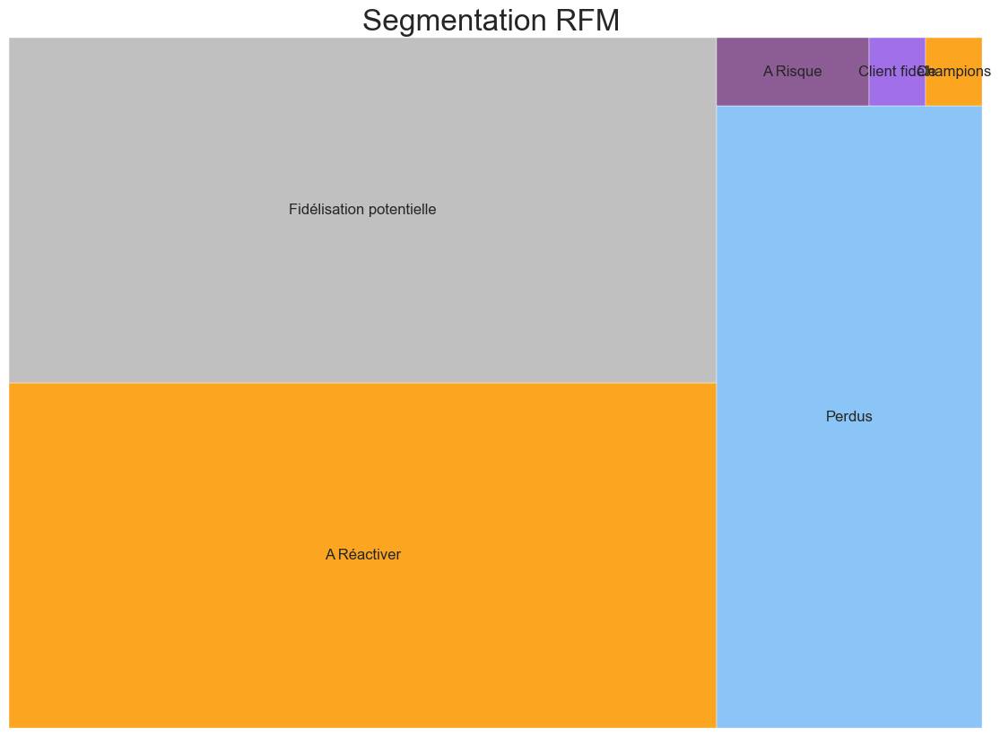

In [156]:
import matplotlib
import matplotlib.pyplot as plt
import squarify
# Squarify plot des types de client
# --------------------------------------------------------------------
# colors = ['#248af1', '#eb5d50', '#8bc4f6', '#8c5c94', '#a170e8',
#           '#fba521', '#75bc3f', 'green', 'red', '#eb5d50', 'blue', 'pink']

colors = ['#fba521', 'Silver', '#8bc4f6', '#8c5c94', '#a170e8',
          '#fba521', '#32CD32', '#FF0000', '#32CD32', 'Silver', '#FF0000',
          '#fba521']
# Dataframe de travail
df_quarify_plot = \
    df_segm_rfm.groupby('RFM_Segm_Client')['customer_unique_id'].nunique() \
    .sort_values(ascending=False).reset_index()
# Valeur mini and maxi
mini = min(df_quarify_plot['customer_unique_id'])
maxi = max(df_quarify_plot['customer_unique_id'])
# Trouver des couleurs pour chaque segmentcustomer_unique_id
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
# Plotting
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(14, 10)
squarify.plot(sizes=df_quarify_plot['customer_unique_id'],
              label=df_quarify_plot.RFM_Segm_Client, alpha=1,
              color=colors)
# Supprimer l'axe
plt.axis('off')
# Title
plt.title("Segmentation RFM ", fontsize=24)
# Title Positioning
ttl = ax.title
ttl.set_position([.5, 1.05])
plt.show()

In [157]:
# Ajouter une variable de tri du patient
df_segm_rfm['RFM_Niveau'] = ['Diamant' if row >= 11
                             else 'Platine' if (row <= 10 and row >= 9)
                             else 'Argent' if (row <= 8 and row >= 7)
                             else 'Bronze'
                             for row in df_segm_rfm['RFM_Score']]

In [158]:
def trace_pieplot(dataframe, variable, titre, legende, liste_colors):
    """
    Suivi des dipsersions : bosplot et qqplot
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                variable : colonne dont on veut voir les outliers (str)
                titre :titre pour les graphiques (str)
                legende : titre de la légende
                liste_colors : liste des couleurs
    @param OUT :None
    """

    plt.figure(figsize=(10, 7))
    plt.title(titre, size=16)
    nb_par_var = dataframe[variable].sort_values().value_counts()
    # nb_par_var = nb_par_var.loc[sorted(nb_par_var.index)]
    explode = [0.1]
    for i in range(len(nb_par_var) - 1):
        explode.append(0)
    wedges, texts, autotexts = plt.pie(
        nb_par_var, labels=nb_par_var.index, autopct='%1.1f%%', colors=liste_colors, textprops={
            'fontsize': 16, 'color': 'black', 'backgroundcolor': 'w'}, explode=explode)
    axes = plt.gca()
    axes.legend(
        wedges,
        nb_par_var.index,
        title=legende,
        loc='upper right',
        fontsize=14,
        bbox_to_anchor=(
            1,
            0,
            0.5,
            1))
    plt.show()

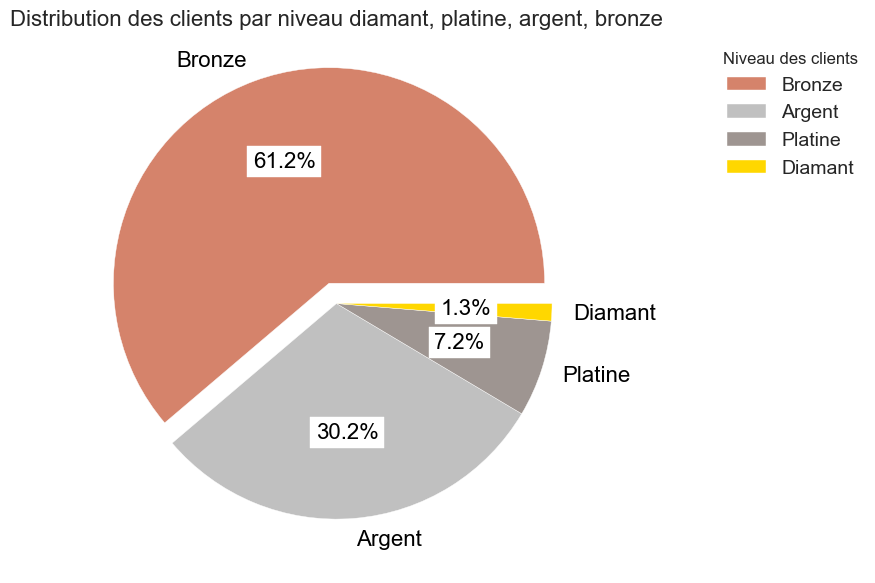

In [159]:
# Pieplot de représentation des clients par niveau
colors_niveau = ['#d5836b', '#C0C0C0', '#9e9591', 'Gold']
title = \
    'Distribution des clients par niveau diamant, platine, argent, bronze'
trace_pieplot(df_segm_rfm, 'RFM_Niveau', title,
                          'Niveau des clients', colors_niveau)

### <span style='background:'>3.4 Stratégie marketing selon les types de clients</span>

***
**1. Champions** :
***
- [X] ***Offrez des récompenses*** : Offrez-leur l'un de vos produits les plus populaires. Cela suscitera davantage de commandes de la part de ces clients à l'avenir.
- [X] ***Construisez votre crédibilité*** : Présentez ces clients partout où vous le pouvez, que ce soit sur la page des commentaires avec des témoignages ou sur les réseaux sociaux. Ils contribueront à promouvoir davantage votre marque.
***
**2. Clients fidèles** :
***
- [X] ***Prenez des retours d'information et des enquêtes*** : Demandez régulièrement l'avis de ces clients régulièrement pour savoir s'ils sont satisfaits ou non de vos produits. Cela vous aidera à savoir ce qu'ils attendent à l'avenir.
- [X] ***Faites des ventes incitatives de vos produits*** : Des études ont prouvé que les clients réguliers dépensent plus lors de leur prochain achat ! Vous pouvez donc leur vendre vos produits à un prix supérieur afin de réaliser des bénéfices supplémentaires.
- [X] ***Offrez des bonus*** : Offrir des bonus aux clients fidèles incite à acheter davantage. Par exemple, la livraison gratuite pendant une période limitée peut être l'un des bonus.

***
**3. Fidélisation potentielle** :
***
- [X] ***Proposez un programme de fidélité*** : Présentez-leur un programme de fidélité ou peut-être une adhésion à un club d'élite afin de ne pas les perdre.
- [X] ***Organisez des concours*** : Gardez ces clients dans la boucle en organisant des concours avec des prix attractifs.
- [X] ***Faites en sorte qu'ils se sentent spéciaux*** : Créez un lien avec ces clients en leur souhaitant un anniversaire, etc. CONSEIL - Offrez-leur une petite carte cadeau ou des points de récompense lors de ces journées spéciales.
- [X] ***Proposez un essai gratuit*** : Proposez-leur un essai gratuit à durée limitée avec des fonctionnalités haut de gamme de votre produit et laissez-les décider de l'achat après la période d'expiration.
- [X] ***Faites connaître votre marque*** : Si vous prévoyez d'organiser un événement, invitez ces clients à y participer en leur proposant une offre sur vos produits haut de gamme, mais pour une durée limitée. CONSEIL - Faites également la promotion de l'événement sur les médias sociaux afin de rallier les non-abonnés.
- [X] ***Proposez une annonce*** : si vous prévoyez une publicité, inscrivez ces clients et laissez-les promouvoir vos produits premium.

***
**4. A Réactiver** :
***
- [X] ***Proposez des produits combinés*** : Passez en revue leurs achats passés et réfléchissez aux combinaisons de produits ou aux offres que vous pouvez leur proposer.
- [X] ***Soyez nostalgique*** : Présentez leurs anciens achats et proposez-leur des produits tendance pour une offre à durée limitée. CONSEIL - Connaissez les 5 principaux facteurs qui influencent le comportement d'achat des clients.
- [X] ***Faites une farce*** : faites participer vos clients à une farce qui tourne autour de vos produits afin de maintenir leur intérêt pour vos produits.
- [X] ***Services sur mesure*** : De nombreux clients s'adaptent aux offres de l'entreprise. Ciblez ces clients en leur proposant des offres sur mesure.
- [X] ***Passez un appel téléphonique*** : Appelez-les personnellement pour connaître la raison pour laquelle ils n'ont pas effectué d'achat. Découvrez ce qui les a rendus
réticents à acheter.
- [X] ***Connectez-vous sur les médias sociaux*** : Restez en contact avec eux par le biais des médias sociaux et tenez-les informés des nouveaux lancements et des nouvelles offres. 1
- [X] ***Décidez si vous voulez qu'il revienne*** : S'il a été difficile de travailler avec le client, il est toujours préférable de le laisser partir. La dernière chose que vous pouvez faire est de vous assurer que vos clients ont une bonne expérience avant de partir.
- [X] ***Passez en revue votre produit*** : La plupart des clients peuvent partir parce qu'ils ne sont pas satisfaits du produit. Consultez les avis sur différents sites pour comprendre la véritable raison.
- [X] ***Envoyez une campagne personnalisée*** : Montrez que vous vous souciez d'eux et prévoyez des offres avec des codes de réduction personnalisés.
- [X] ***Partagez des ressources précieuses*** : Faites-leur savoir comment vos produits sont utiles aux clients ou donnez-leur des liens utiles.
- [X] ***Donnez votre analyse de la concurrence*** : Faites savoir à vos clients en quoi vos produits sont bien meilleurs que ceux de vos concurrents.
- [X] ***Fournissez des mises à jour pertinentes*** : Fournissez-leur du contenu éducatif en rapport avec vos produits.

***
**5. A Risque** :
***
- [X] ***Offrez un crédit*** : donnez-leur un certain montant de crédit sur leur achat. Ce type d'offre rend l'offre tangible et les clients sentent que cela en vaut la peine.
- [X] ***Proposez une liste de souhaits*** : Ces clients ajoutent des produits à leur liste de souhaits et suivent les offres sur ces produits. Organisez une vente en fonction de leur liste de souhaits de temps en temps.
- [X] ***Offres de mise à niveau*** : Tous les clients aiment les mises à niveau gratuites. C'est le meilleur moyen de les fidéliser.


***
**6. Perdus** :
***
- [X] ***Comprenez-les*** : Faites des recherches sur vos clients perdus afin d'élaborer une stratégie pour les faire revivre.
- [X] ***Faites une dernière promotion*** : Envoyez un e-mail de promotion qui dit par exemple : "Vous nous manquez. Voici votre cadeau : obtenez 25 % de réduction sur l'ensemble de votre commande."
- [X] ***Ignorez-les complètement*** : C'est la dernière chose que vous pouvez faire. Il est fort probable que ce type de clients ne reviendra pas. Dans ce cas, ce sera une perte de temps et d'argent pour l'entreprise.

[Source](https://www.coursehero.com/file/55227132/RFM-Analysis-11-customer-segments-compressedpdf/)

***
**4. Nouveaux clients** :
***
- [X] ***Fournissez une aide à l'accueil*** : Guidez vos nouveaux clients à l'aide d'un kit d'accueil - courriel de bienvenue, guide des produits, etc.
- [X] ***Offrez-leur des remises*** : Accueillez vos nouveaux clients en leur offrant des points de réduction ou des coupons sur leur prochain achat pour les inciter à revenir.
- [X] ***Établissez une relation*** : Proposez votre aide à chaque étape. Répondez à leurs questions, demandez-leur leur avis pour éviter qu'ils ne se détournent de votre site.


## <span style='background:#33B5FF'>4. Clustering: Généralités</span>

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

**Clustering** :
- Les techniques de clustering cherchent à décomposer un ensemble d'individus en plusieurs sous ensembles les plus homogènes possibles sans connaître la classe des exemples (nombre, forme, taille...).

**Méthodes de clustering** :
***
- <span style='background:Moccasin'>**Méthodes de partitionnement**</span> : construire une partition en classes d'un ensemble d'objets ou d'individus hiérarchiques. Création d'une partition initiale de K classes, puis itération d'un processus qui optimise le partitionnement en déplaçant les objets d'une classe à l'autre.
    - **méthodes K-moyennes** : une classe est représentée par son centre de gravité (ex : ***K-Means***).
    - **méthode K-medoids** : une classe est représentée par son élément le plus représentatif (ex : algo ***PAM*** Partitioning around medoids, ***CLARA*** Clustring Large Applications).
    - **partitionnement spectral** : principe = passer par graphe d’adjacence. Calculer matrice « Laplacienne » L=D-A du graphe adjacence. Trouver et trier valeurs propres de L (symétrique => valeurs propres réelles >=0, et vecteurs propres perpendiculaires. Projeter les points sur k vect propres de plus grandes valeurs propres, pour séparer plus facilement.
***
- <span style='background:Moccasin'>**Méthodes hiérarchiques**</span> : les clusters sont organisés sous la forme d'une structure d'arbre (le nombre de clusters n'est pas défini) en utilisant les distances entre les classes.
    - **approche hiérarchique ascendante RHA (ou agglomération)** : on commence avec un objet dans chaque classe, puis on fusionne successivement les 2 classes les plus proches et on s'arrête quand il n'y a plus qu'une classe contenant tous les exemples (recherche : ***BIRCH*** (1996) : basée sur la représentation d'une classe par ses traits caractéristiques et ***CHAMELEON*** (1999) : basée sur la théorie des graphes et une représentation plus riche des données).
    - **approche descendante (ou par division)** : tous les objets sont  initialement dans la même classe, puis division de la classe en sous classes jusqu'à ce qu'il y ait suffisamment de niveaux ou que les classes ne contiennent plus qu'un seul exemple.
***
- <span style='background:Moccasin'>**Méthodes de modélisation**</span> :
    - **à base de densité** : utilisation de la densité à la place de la distance. Les clusters sont des régions de l'espace qui ont une grande densité de points (ex : ***DBSCAN*** (1996), ***HDBSCAN***, ***OPTICS*** (1999), ***DENCLUE** (1998), ***CLIQUE*** (1998)).
        - Un point est dense si le nombre de ses voisins dépasse un certain seuil
        - Un point est voisin d'un autre point s'il est à une distance inférieure à une valeur fixée.
        
  - **mélange de gaussiennes** : clustering en utilisant les mixtures gaussiennes. La valeur de K correspond au nombre de composantes de la mixture (ex : algo ***EM*** Expectation Maximization, ***GMM***, ).
   - Cartes de Kohonen (Self-Organizing Maps, SOM).
***
- <span style='background:Moccasin'>**Méthodes à base de grille**</span> : Méthode basée sur le découpage de l'espace des exemples suivant une grille. Après initialisation, toutes les opérations de clustering sont réalisées sur les cellules, plutôt que sur les données. Construction des classes en assemblant les cellules voisines en terme de distance (ex : ***STING*** (a STatistical Information Grid approach (1997), ***Cluster*** (utilise la notion d'ondelettes) (1998)).
***
- <span style='background:Moccasin'>**Recherche d'espaces latents**</span> : Y'a t-il dans l'espace de description, des sous-espaces où la densité d'objets est plus importante que d'autres ? Comment déterminer et caractériser ces régions ? (ex : ***ACP***).

## <span style='background:#33B5FF'>5. Explorer les données</span>

In [6]:
# Contenu des 3 premieres lignes
data_clients.head(3)

,customer_city,customer_state,geolocation_lat,geolocation_lng,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,date_dernier_achat,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,moyen_paiement,cat_produit_prefere
customer_unique_id,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,-23.335331,-46.828647,112.0,1.0,141.90,5.0,2018-05-10 10:56:27,1,1.0,129.9,8.0,12.00,credit_card,cama_mesa_banho
0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,-23.567395,-46.792957,115.0,1.0,27.19,4.0,2018-05-07 11:11:27,1,1.0,18.9,1.0,8.29,credit_card,beleza_saude
0000f46a3911fa3c0805444483337064,sao jose,SC,-27.543787,-48.625680,537.0,1.0,86.22,3.0,2017-03-10 21:05:03,1,1.0,69.0,8.0,17.22,credit_card,papelaria


### <span style='background:'>5.1 Dataframe de travail variables quantitatives </span>

In [7]:
# Selection des variables numériques
cols_num = data_clients.select_dtypes(include=[np.number]).columns.to_list()
data_clients = data_clients[cols_num]
data_clients.shape

(78597, 11)

***Standardisation des données StandardScaler***

In [8]:
# Standardisation StandardScaler - variable non transformées en log
# -----------------------------------------------------------------------
# Préparation des données
X = data_clients.values
features = data_clients.columns

# Standardisation avec StandardScaler (centre, réduit et rend plus la
# distribution plus normale)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dataframe
X_scaled = pd.DataFrame(X_scaled,
                        index=data_clients.index,
                        columns=features)

### <span style='background:'>5.2 Dataframe de travail variables quantitatives + qualitatives encodées + transformée en log </span>

In [9]:
# copie du jeux de données
df_clients_cat = data.copy()

**Pré-Processing**

In [10]:
# Suppression de la  variable date  dernière commande inutile
df_clients_cat.drop(columns=['date_dernier_achat'],
                inplace=True)

In [11]:
# Sélection des variables numériques
cols_num_cat = df_clients_cat.select_dtypes(include=[np.number]) \
    .columns.to_list()

**Transformation Logarithmique**

In [12]:
# Transformation en logarithme pour avoir le même poids
col_to_log_cat = cols_num_cat[2:11]
df_clients_cat[col_to_log_cat] = df_clients_cat[col_to_log_cat] \
    .apply(np.log1p, axis=1)
col_to_log_cat

['rfm_recence',
 'rfm_frequence',
 'rfm_montant',
 'note_avis_mean',
 'nbr_commandes',
 'nbr_articles_mean',
 'panier_moyen',
 'echeance_paiement_mean',
 'frais_port_mean']

**Standardisation**

In [13]:
# Standardisation StandardScaler - variable transformées en log
# -----------------------------------------------------------------------
# Préparation des données
X_cat_log = df_clients_cat[cols_num_cat].values
features_cat = df_clients_cat[cols_num_cat].columns

# Standardisation avec StandardScaler (centre, réduit et rend plus la
# distribution plus normale)
scaler = StandardScaler()
X_scaled_cat = scaler.fit_transform(X_cat_log)

# Dataframe
X_scaled_cat = pd.DataFrame(X_scaled_cat,
                        index=df_clients_cat[col_to_log_cat].index,
                        columns=features_cat)

**Encodage**

In [14]:
# Encodage du moyen de paiement préféré
encod_paiement = pd.get_dummies(df_clients_cat['moyen_paiement'])
X_scaled_cat = X_scaled_cat.join(encod_paiement)

In [15]:
# Encodage du moyen de la categorie de produit préféré
encod_art_pr = pd.get_dummies(df_clients_cat['cat_produit_prefere'])
X_scaled_cat = X_scaled_cat.join(encod_art_pr)

In [16]:
umap_cols_num = X_scaled_cat.columns[0:11]
X_umap_cat_num = X_scaled_cat[umap_cols_num]
umap_cols_num

Index(['geolocation_lat', 'geolocation_lng', 'rfm_recence', 'rfm_frequence',
       'rfm_montant', 'note_avis_mean', 'nbr_commandes', 'nbr_articles_mean',
       'panier_moyen', 'echeance_paiement_mean', 'frais_port_mean'],
      dtype='object')

In [17]:
umap_cols_cat = X_scaled_cat.columns[11:]
X_umap_cat_qual = X_scaled_cat[umap_cols_cat]
umap_cols_cat

Index(['boleto', 'credit_card', 'debit_card', 'voucher',
       'agro_industria_e_comercio', 'alimentos', 'alimentos_bebidas', 'artes',
       'artes_e_artesanato', 'artigos_de_festas', 'artigos_de_natal', 'audio',
       'automotivo', 'bebes', 'bebidas', 'beleza_saude', 'brinquedos',
       'cama_mesa_banho', 'casa_conforto', 'casa_conforto_2',
       'casa_construcao', 'cds_dvds_musicais', 'cine_foto', 'climatizacao',
       'consoles_games', 'construcao_ferramentas_construcao',
       'construcao_ferramentas_ferramentas',
       'construcao_ferramentas_iluminacao', 'construcao_ferramentas_jardim',
       'construcao_ferramentas_seguranca', 'cool_stuff', 'dvds_blu_ray',
       'eletrodomesticos', 'eletrodomesticos_2', 'eletronicos',
       'eletroportateis', 'esporte_lazer', 'fashion_bolsas_e_acessorios',
       'fashion_calcados', 'fashion_esporte', 'fashion_roupa_feminina',
       'fashion_roupa_infanto_juvenil', 'fashion_roupa_masculina',
       'fashion_underwear_e_moda_praia', '

## <span style='background:#33B5FF'>6. Clustering de partitionnement</span>

***Note*** :
***
- La méthode de clustering k-means est une technique d'apprentissage automatique non supervisée utilisée pour identifier les patterns d’individus que l’on va regrouper selon des similarités donc il est parfait pour segmenter les clients.
- L'algorithme :
- Ces techniques nécessitent que l'utilisateur spécifie le nombre de clusters, indiqué par la variable k.
- Cet algorithme est non déterministe, ce qui signifie qu'il peut produire des résultats différents à partir de deux exécutions distinctes, même si les exécutions sont basées sur la même entrée.
- La qualité des affectations de clusters est déterminée en calculant la somme de l'erreur quadratique (SSE) après que les centroïdes convergent, ou correspondent à l'affectation de l'itération précédente. La SSE est définie comme la somme des carrés des distances euclidiennes de chaque point à son centroïde le plus proche. Comme il s'agit d'une mesure de l'erreur, l'objectif des k-means est d'essayer de minimiser cette valeur.

In [18]:
# Dataframe de sauvegarde des résultats des métriques KMeans
df_metrics_kmeans = pd.DataFrame()

In [19]:
def calcul_metrics_kmeans(data, dataframe_metrique, type_donnees,
                          random_seed, n_clusters, n_init, init):
    '''
    Calcul des métriques de KMeans en fonction de différents paramètres.
    Parameters
    ----------
    data : données, obligatoire.
    dataframe_metrique : dataframe de sauvegarde des résultats, obligatoire.
    type_donnees : string intitulé des données, obligatoire.
    random_seed : nombre aléatoire pour la reproductibilité, obligatoire.
    n_clusters : liste du nombre de clusters, obligatoire,
    n_init : nombre de clusters à initialiser, obligatoire.
    init : type d'initialisation : 'k-means++' ou 'random'.
    Returns
    -------
    dataframe_metrique : résultat des métriques
    '''
    # Cette fonction permet de calculer le nombre de clusters le plus
    # optimal pour notre analyse : le coefficient de silhouette,
    # dispersion
    silhouette = []
    dispersion = []
    donnees = []
    temps = []

    result_clusters = []
    result_ninit = []
    result_type_init = []

    # Hyperparametre tuning
    n_clusters = n_clusters
    nbr_init = n_init
    type_init = init

    # Tester le modèle entre 2 et 12 clusters
    for num_clusters in n_clusters:

        for init in nbr_init:

            for i in type_init:
                # Top début d'exécution
                time_start = time.time()

                # Initialisation de l'algorithme
                cls = KMeans(n_clusters=num_clusters,
                             n_init=init,
                             init=i,
                             random_state=random_seed)

                # Entraînement de l'algorithme
                cls.fit(data)

                # Prédictions
                preds = cls.predict(data)

                # Top fin d'exécution
                time_end = time.time()

                # Calcul du score de coefficient de silhouette
                silh = silhouette_score(data, preds)
                # Calcul la dispersion
                disp = cls.inertia_
                # Durée d'exécution
                time_execution = time_end - time_start

                silhouette.append(silh)
                dispersion.append(disp)
                donnees.append(type_donnees)
                temps.append(time_execution)

                result_clusters.append(num_clusters)
                result_ninit.append(init)
                result_type_init.append(i)

    dataframe_metrique = dataframe_metrique._append(pd.DataFrame({
        'Type_données': donnees,
        'nbr_clusters': result_clusters,
        'n_init': result_ninit,
        'type_init': result_type_init,
        'coef_silh': silhouette,
        'dispersion': dispersion,
        'Durée (s)': temps
    }), ignore_index=True)

    return dataframe_metrique

seed=21

In [20]:
# Métriques pour les données quantitatives standardisées, non transformées
# en logarithme
# Paramètres à tester

nb_clusters = range(2, 8)
n_init = [10]
init = ['k-means++']
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = \
    calcul_metrics_kmeans(X_scaled, df_metrics_kmeans,
                                             'Quant non log', seed,
                                              nb_clusters, n_init, init)
df_metrics_kmeans.style.hide()

Type_données,nbr_clusters,n_init,type_init,coef_silh,dispersion,Durée (s)
Quant non log,2,10,k-means++,0.510510,763389.409676,1.086242
Quant non log,3,10,k-means++,0.523300,673652.398800,1.002655
Quant non log,4,10,k-means++,0.166883,611803.608979,1.248455
Quant non log,5,10,k-means++,0.167736,545807.222825,1.302740
Quant non log,6,10,k-means++,0.216792,496929.307159,1.382219
Quant non log,7,10,k-means++,0.225953,454670.439368,2.092124


**Note** : **Nous avons les clusters 2 ou 3 qui sont optimals**

In [21]:
# Métriques pour les données quantitatives standardisées, transformées
# en logarithme + données qualitatives
# Paramètres à tester
nb_clusters = range(2, 8)
n_init = [10]
init = ['k-means++']
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans = \
    calcul_metrics_kmeans(X_scaled_cat,df_metrics_kmeans,
                                              'Quant log + Qual', seed,
                                              nb_clusters, n_init, init)
df_metrics_kmeans.style.hide()

Type_données,nbr_clusters,n_init,type_init,coef_silh,dispersion,Durée (s)
Quant non log,2,10,k-means++,0.510510,763389.409676,1.086242
Quant non log,3,10,k-means++,0.523300,673652.398800,1.002655
Quant non log,4,10,k-means++,0.166883,611803.608979,1.248455
Quant non log,5,10,k-means++,0.167736,545807.222825,1.302740
Quant non log,6,10,k-means++,0.216792,496929.307159,1.382219
Quant non log,7,10,k-means++,0.225953,454670.439368,2.092124
Quant log + Qual,2,10,k-means++,0.540718,821733.956393,1.714944
Quant log + Qual,3,10,k-means++,0.169135,702523.410358,2.971950
Quant log + Qual,4,10,k-means++,0.170052,631220.942796,3.489274
Quant log + Qual,5,10,k-means++,0.160795,582462.890725,4.855302


In [22]:
df_quant_non_log = \
    df_metrics_kmeans[df_metrics_kmeans['Type_données'] == 'Quant non log']
df_quant_log_cat = \
    df_metrics_kmeans[df_metrics_kmeans['Type_données'] == 'Quant log + Qual']

**Methode Elbow**

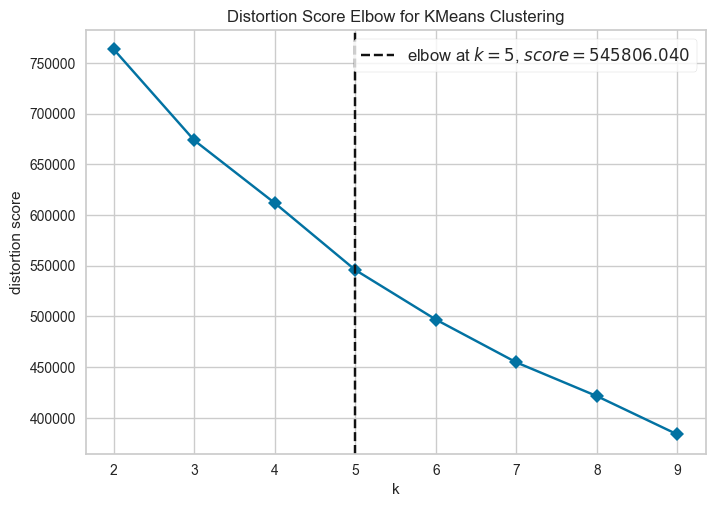

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [23]:
# Instanciation du modèle
model = KMeans(random_state=seed, n_init= 10)

# Hyperparamètre k entre 2 et 9
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(2, 10), timings=False)

# Entraîne le modèle
visualizer.fit(X_scaled)
visualizer.show()

**Note**: nombre de clusters optimal autour de 4, 5, 6 ...

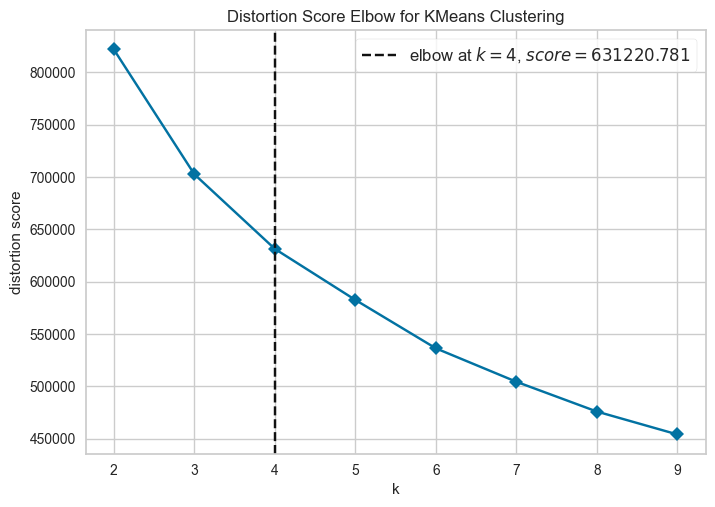

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [24]:
# Instanciation du modèle
model = KMeans(random_state=seed, n_init= 10 )

# Hyperparamètre k entre 2 et 9
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(2, 10), timings=False)

# Entraîne le modèle
visualizer.fit(X_scaled_cat)
visualizer.show()

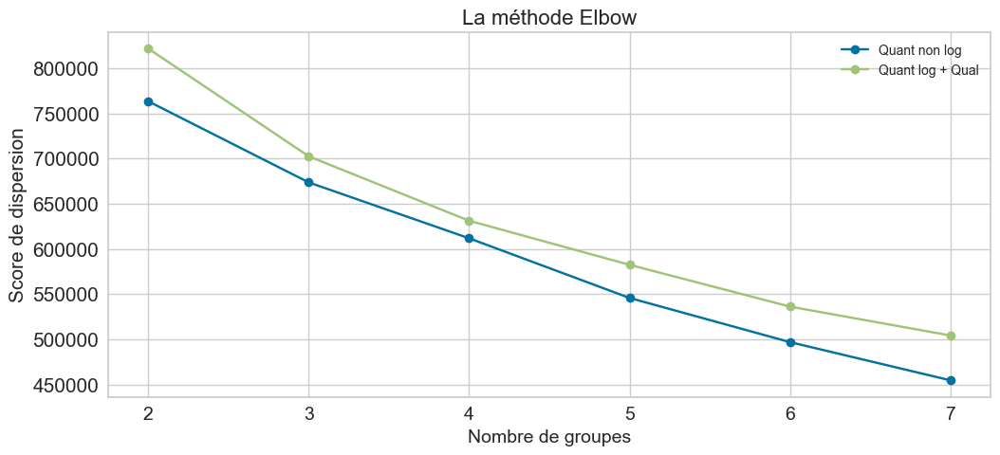

In [25]:
# Trace le graphique des dispersions
plt.figure(figsize=(12, 5))

plt.title('La méthode Elbow', fontsize=16)
plt.plot([i for i in range(2, 8)],  df_quant_non_log['dispersion'].to_list(), marker='o')
plt.plot([i for i in range(2, 8)], df_quant_log_cat['dispersion'].to_list(),marker='o')
plt.grid(True)
plt.xlabel('Nombre de groupes', fontsize=14)
plt.ylabel('Score de dispersion', fontsize=15)
plt.xticks([i for i in range(2, 8)], fontsize=14)
plt.yticks(fontsize=15)
plt.legend(labels=[ 'Quant non log','Quant log + Qual'])

plt.show()

**Methode Elbow**:
- Quant non log : 3 ou 4
- Quant log +qual: 3 ou 6

**Coefficient de Silhouette**

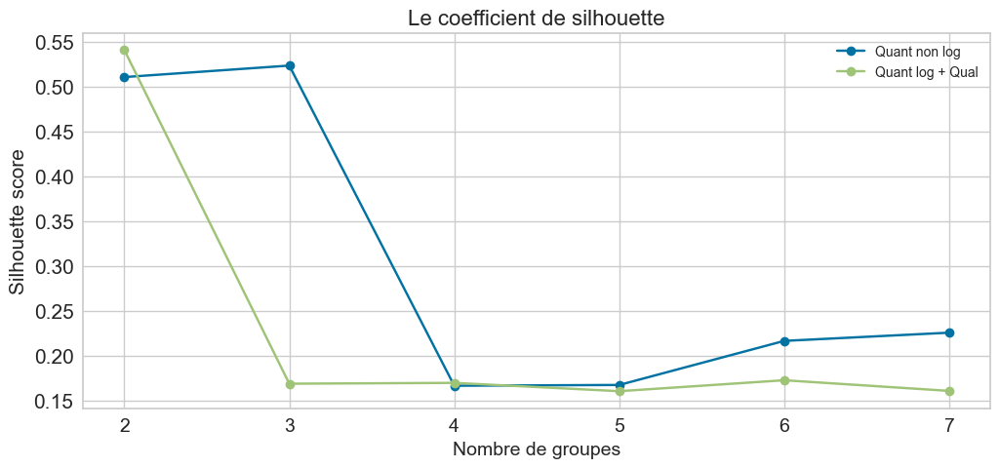

In [26]:
# Trace le graphique des coefficient de silhouette
plt.figure(figsize=(12, 5))

plt.title('Le coefficient de silhouette', fontsize=16)
plt.plot([i for i in range(2, 8)], df_quant_non_log['coef_silh'].to_list(),
         marker='o')
plt.plot([i for i in range(2, 8)], df_quant_log_cat['coef_silh'].to_list(),
         marker='o')
plt.grid(True)
plt.xlabel('Nombre de groupes', fontsize=14)
plt.ylabel('Silhouette score', fontsize=15)
plt.xticks([i for i in range(2, 8)], fontsize=14)
plt.yticks(fontsize=15)
plt.legend(labels=[ 'Quant non log','Quant log + Qual'])

plt.show()

**Bilan** :
***
Les différents indices donnent des nombres de clusters k optimal différents pour les différents types de données :
- quantitatives sans logarithme:
  - **Méthode Elbow** : 3 ou 4 clusters.
  - **Coefficient de silhouette** : 4 ou 5 clusters.
- quantitatives avec logarithme + qualitatives :
  - **Méthode Elbow** : 3 ou 6 clusters.
  - **Coefficient de silhouette** : 5 ou 6 clusters.

In [27]:
def affiche_umap_par_clusters(proj_umap, clusters_labels, nbre_clusters):
    '''
    Affiche la projection 2D par UMAP par clusters.
    Parameters
    ----------
    proj_umap : projection UMAP, obligatoire.
    clusters_labels : la variable représentant les clusters.
    nbre_clusters : nombre de clusters pour les couleurs
    Returns
    -------
    None.
    '''
    plt.figure(figsize=[12, 12])
    sns.set_style('white')

    if nbre_clusters <= 10:
        sns.scatterplot(x=proj_umap[:, 0],
                        y=proj_umap[:, 1],
                        hue=clusters_labels,
                        legend='full',
                        palette=sns.color_palette('hls', n_colors=nbre_clusters))
    else:
        sns.scatterplot(x=proj_umap[:, 0],
                        y=proj_umap[:, 1],
                        hue=clusters_labels,
                        legend='full')
    plt.show()

In [28]:
def affiche_radarplot_par_clusters(dataframe, var_cluster, nb_rows, nb_cols):
    '''
    Affiche les radars plot des différents clusters pour l'interprétation.
    Parameters
    ----------
    dataframe : dataframe des données, obligatoire.
    var_cluster : str nom de la variable représentant le label des clusters,
                  obligatoire.
    nb_rows : nombre de lignes pour afficher les radars plots, obligatoire.
    nb_cols : nombre de colonnes pour afficher les radars plots.
    Returns
    -------
    None.
    '''
    # Radarplot des différents clusters
    # --------------------------------------------------------------------

    cols_a_interpreter = dataframe.columns.to_list()
    # cols_a_interpreter.remove('dernier_achat_annee')
    df_plot_seg = dataframe[cols_a_interpreter].set_index(var_cluster)
    # Standardisation
    min_max = MinMaxScaler()
    df_plot_seg = pd.DataFrame(min_max.fit_transform(df_plot_seg.values),
                               index=df_plot_seg.index,
                               columns=df_plot_seg.columns)
    plt.rc('axes', facecolor='Gainsboro')

    # number of variable
    categories = list(df_plot_seg.columns)

    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot /
    # number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]

    fig = plt.figure(1, figsize=(20, 35))

    colors = ['#023eff', '#ff7c00', '#1ac938', '#e8000b', '#892adf',
              '#9f4800', '#f14cc1', '#a3a3a3', '#ffc400', '#00d7ff']

    for i, cluster in enumerate(df_plot_seg.index):

        ax = fig.add_subplot(nb_rows, nb_cols, i + 1, polar=True)

        ax.set_theta_offset(2 * pi / 3)
        ax.set_theta_direction(-1)
        ax.set_rlabel_position(0)

        # Draw one axe per variable + add labels labels yet
        plt.xticks(angles, categories, size=10)
        plt.yticks(color="grey", size=2)
        values = df_plot_seg.iloc[i].values
        ax.plot(angles, values, linewidth=1, linestyle='solid')
        ax.fill(angles, values, colors[i], alpha=0.55)
        ax.set_xticks(angles)
        ax.set_xticklabels(categories, fontsize=12)
        ax.set_title('Cluster ' + str(cluster), size=20, color=colors[i])
        ax.grid(True)
        plt.grid(True)
        plt.ylim(0, 1)

    plt.show()

In [37]:
def affiche_clients_par_clusters(clusters_labels):
    '''
    Affiche la répartitionn des clients par cluster
    Parameters
    ----------
    clusters_labels : la séries des labels des clusters, obligatoire.
    Returns
    -------
    None.
    '''
    ax1 = plt.gca()

    # DataFrame de travail
    series_client_cluster = pd.Series(clusters_labels).value_counts()
    nb_client = series_client_cluster.sum()
    df_visu_client_cluster = pd.DataFrame(
        {'Clusters': series_client_cluster.index,
         'Nb_clients': series_client_cluster.values})
    df_visu_client_cluster['%'] = round(
        (df_visu_client_cluster['Nb_clients']) * 100 / nb_client, 2)
    df_visu_client_cluster = df_visu_client_cluster.sort_values(by='Clusters')
    display(df_visu_client_cluster.style.hide())

    # Barplot de la distribution
    sns.set_style('white')
    sns.barplot(x='Clusters', y='Nb_clients',
                data=df_visu_client_cluster, color='SteelBlue', ax=ax1)
    ax1.set_ylabel('Nombre de clients)', fontsize=12)
    ax1.set_xlabel('Clusters', fontsize=12)
    ax1.set_title('Nombre de clients par clusters', fontsize=14)
    plt.gcf().set_size_inches(6, 4)
    plt.grid(False)
    plt.show()

### <span style='background:'>6.1.  K-Means : Variables quantitatives sans logarithme </span>



**Segmentation k-Means avec k=3**

In [29]:
# Dataframe de sauvegarde des résultats des métriques KMeans
df_metrics_kmeans_k_3 = pd.DataFrame()

In [30]:
# Tuning hyperparametres n_init et init
# Métriques pour les données quantitatives standardisées, non transformées
# en logarithme
# Paramètres à tester
n_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans_k_3 = calcul_metrics_kmeans(X_scaled,
                                              df_metrics_kmeans_k_3,
                                              'Kmeans 3 clusters', seed,
                                              n_clusters, n_init, init)
df_metrics_kmeans_k_3.style.hide()

Type_données,nbr_clusters,n_init,type_init,coef_silh,dispersion,Durée (s)
Kmeans 3 clusters,3,10,k-means++,0.523300,673652.398800,0.972334
Kmeans 3 clusters,3,10,random,0.523226,673652.477773,1.834879
Kmeans 3 clusters,3,20,k-means++,0.523300,673652.398800,2.056303
Kmeans 3 clusters,3,20,random,0.523300,673652.398800,1.724900
Kmeans 3 clusters,3,30,k-means++,0.523300,673652.398800,3.087615
Kmeans 3 clusters,3,30,random,0.523300,673652.398800,2.706779
Kmeans 3 clusters,3,50,k-means++,0.523300,673652.398800,5.344147
Kmeans 3 clusters,3,50,random,0.523300,673652.398800,3.911985
Kmeans 3 clusters,3,70,k-means++,0.523300,673652.398800,7.451831
Kmeans 3 clusters,3,70,random,0.523300,673652.398800,5.419200


**Bilan** :
***
Les meilleurs scores sont trouvés pour :
- n_init=10 : c'est la valeur par défaut.
- init=k-means++ (pas la valeur par défaut 'random').

In [31]:
%%time
# Instanciation du modèle KMeans pour 3 clusters et  meilleurs paramètres
kmeans_3 = KMeans(n_clusters=3, init='k-means++', random_state=seed)
clusters_km_3 = kmeans_3.fit(X_scaled)
kmeans_3_labels = kmeans_3.labels_

CPU times: user 2.3 s, sys: 70.8 ms, total: 2.37 s
Wall time: 2.18 s


In [32]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_kmeans = data_clients.copy()
data_kmeans['Cluster_3'] = kmeans_3.labels_

In [33]:
# Projection UMAP en 2D
projector_umap = UMAP(random_state=seed,
                      n_neighbors=200,
                      min_dist=0.8,
                      n_components=2,
                      metric='manhattan')
X_projected_umap = projector_umap.fit_transform(X_scaled)

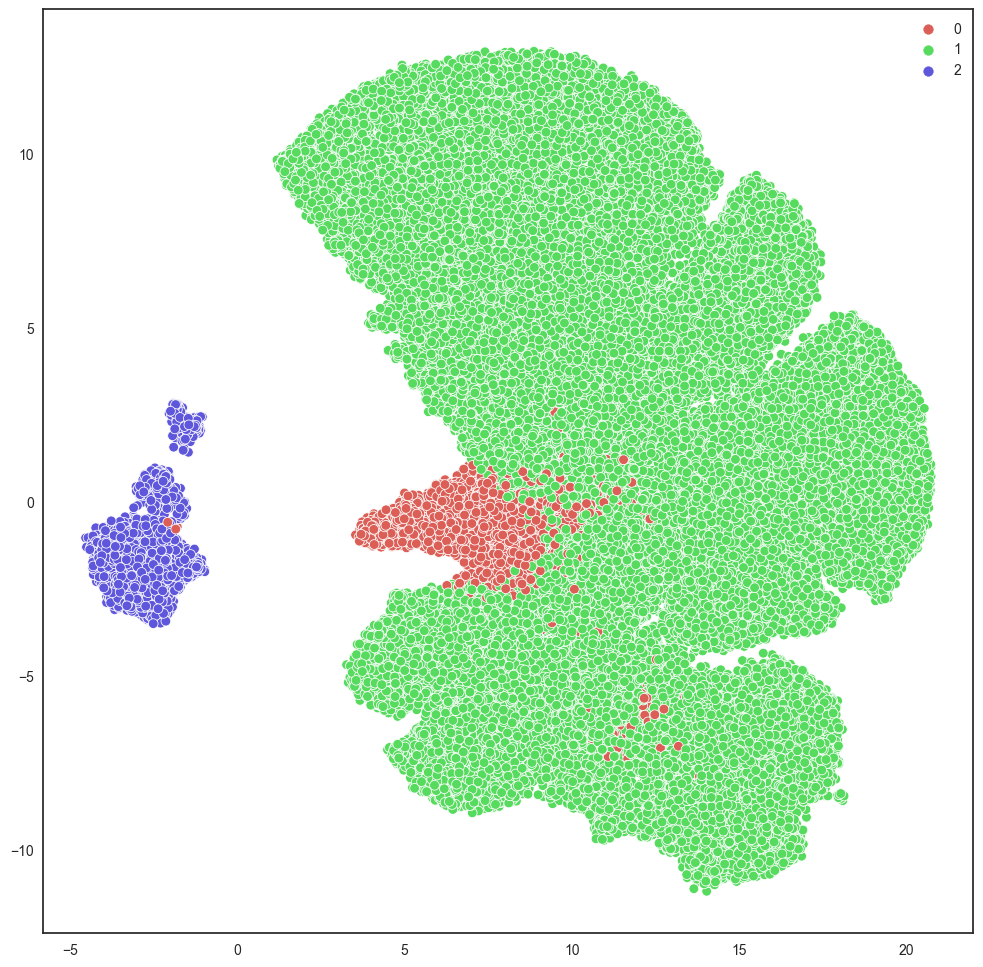

In [34]:
# Visualisation en 2D avec UMAP
affiche_umap_par_clusters(X_projected_umap, kmeans_3_labels, 3)

Clusters,Nb_clients,%
0,3665,4.660000
1,72561,92.320000
2,2371,3.020000


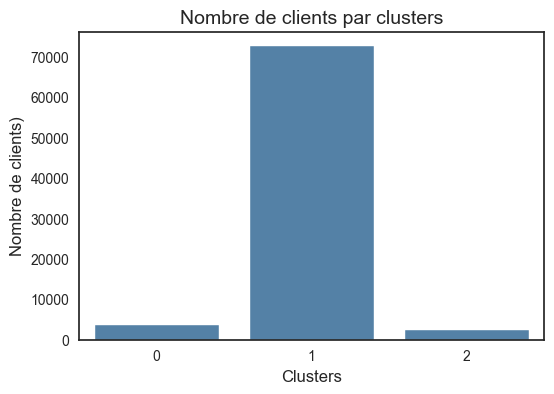

In [38]:
affiche_clients_par_clusters(kmeans_3_labels)

**Interpretation des 3 clusters**

In [39]:

df_interpret_k3 = \
    data_kmeans.groupby('Cluster_3').agg({'rfm_recence' : 'mean',
                                          'rfm_frequence' : 'mean',
                                          'rfm_montant' : 'mean',
                                          'note_avis_mean' : 'mean',
                                          'nbr_commandes' : 'mean',
                                          'nbr_articles_mean' : 'mean',
                                          'panier_moyen': 'mean',
                                          'echeance_paiement_mean' : 'median',
                                          'frais_port_mean' : 'mean'})
df_interpret_k3.reset_index(inplace = True)
df_interpret_k3.head()

,Cluster_3,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,228.510778,1.004093,787.260936,4.057299,1.012278,1.000819,679.260086,8.0,50.141652
1,1,236.205841,1.000000,119.963568,4.179959,1.000000,1.000276,93.952178,1.0,16.845209
2,2,217.129903,2.107128,285.662269,4.229282,5.307043,1.000422,100.448183,2.0,17.680355


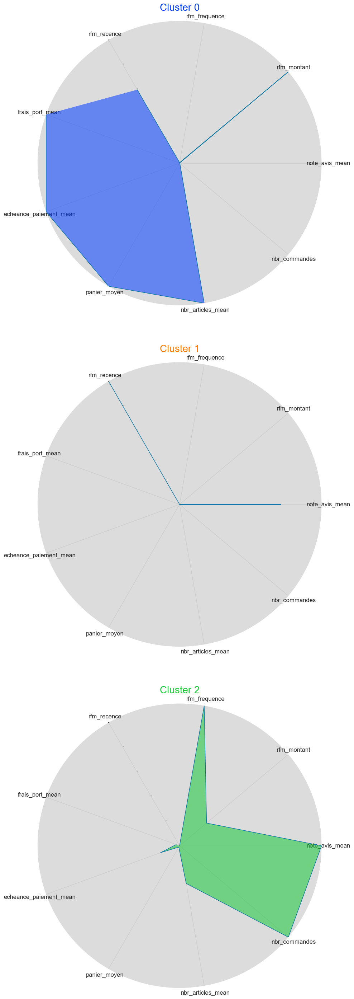

In [40]:
affiche_radarplot_par_clusters(df_interpret_k3, 'Cluster_3', 3, 1)

**Bilan** :
***
- **Cluster 0** : commandes anciennes, peu fréquentes et d'un faible montant, dernier achat très anciens ==> **clients presque perdus**.    
- **Cluster 1** : commandes très récentes, peu fréquentes et d'un faible montant ==> **nouveaux clients**.
- **Cluster 2** : commandes récentes, fréquentes et d'un bon montant ==> **meilleurs clients**.

**Segmentation k-Means avec k=4**

In [41]:
# Dataframe de sauvegarde des résultats des métriques KMeans
df_metrics_kmeans_k_4 = pd.DataFrame()

In [42]:
# Tuning hyperparametres n_init et init
# Métriques pour les données quantitatives standardisées, non transformées
# en logarithme
n_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans_k_4 =calcul_metrics_kmeans(X_scaled,
                                              df_metrics_kmeans_k_4,
                                              'Kmeans 4 clusters', seed,
                                              n_clusters, n_init, init)
df_metrics_kmeans_k_4.style.hide()

Type_données,nbr_clusters,n_init,type_init,coef_silh,dispersion,Durée (s)
Kmeans 4 clusters,4,10,k-means++,0.166883,611803.608979,1.151745
Kmeans 4 clusters,4,10,random,0.168757,611870.738007,2.020918
Kmeans 4 clusters,4,20,k-means++,0.166883,611803.608979,3.731474
Kmeans 4 clusters,4,20,random,0.168757,611870.738007,2.789898
Kmeans 4 clusters,4,30,k-means++,0.166883,611803.608979,4.039520
Kmeans 4 clusters,4,30,random,0.166941,611801.150588,2.790083
Kmeans 4 clusters,4,50,k-means++,0.166877,611803.480994,5.868552
Kmeans 4 clusters,4,50,random,0.166941,611801.150588,4.426547
Kmeans 4 clusters,4,70,k-means++,0.523722,607637.528801,8.152547
Kmeans 4 clusters,4,70,random,0.168112,611777.605989,5.997128


**Bilan** :
***
Les meilleurs scores sont trouvés pour :
- n_init=70
- init=k-means++ (pas la valeur par défaut 'random').

In [43]:
%%time
# Instanciation du modèle KMeans pour 4 clusters + meilleurs paramètres
kmeans_4 = KMeans(n_clusters=4, init='k-means++', random_state=seed, n_init=70)
clusters_km_4 = kmeans_4.fit(X_scaled)
kmeans_4_labels = kmeans_4.labels_

CPU times: user 14.5 s, sys: 860 ms, total: 15.4 s
Wall time: 29.4 s


In [44]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_kmeans['Cluster_4'] = kmeans_4.labels_

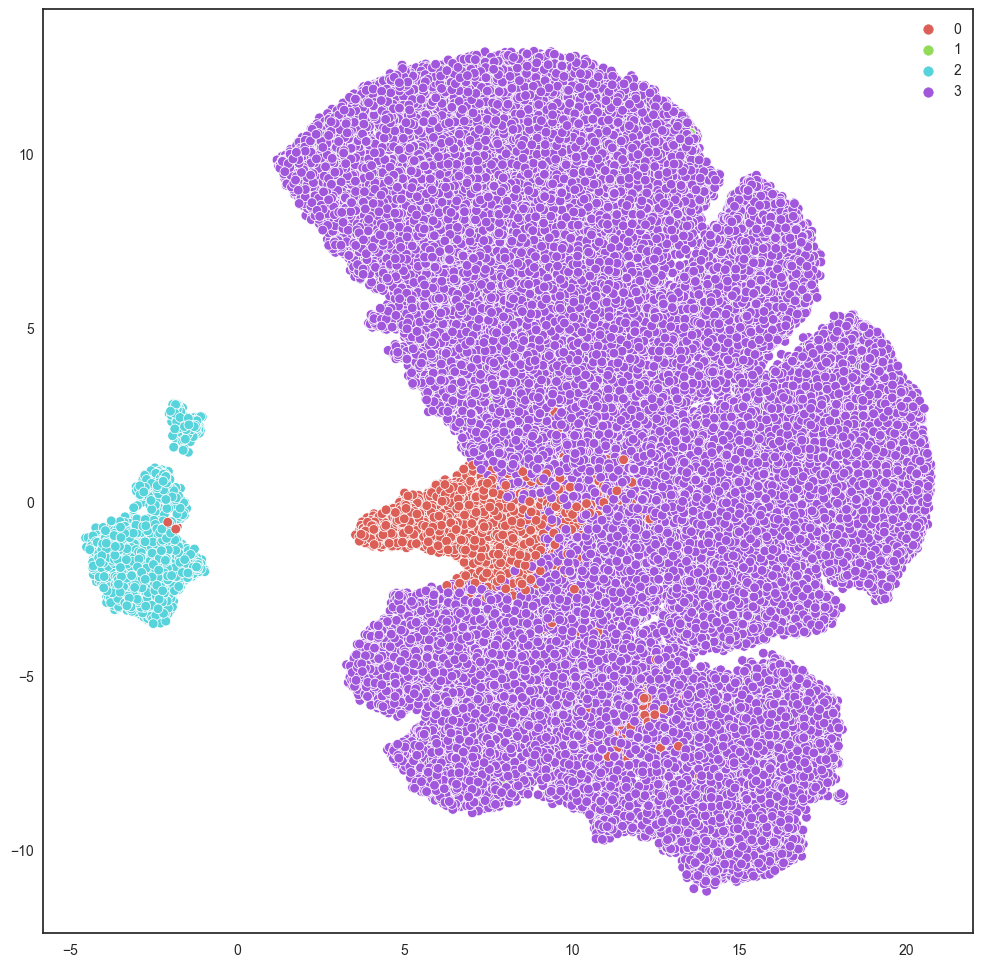

In [49]:
# Visualisation en 2D avec UMAP
affiche_umap_par_clusters(X_projected_umap, kmeans_4_labels, 4)

Clusters,Nb_clients,%
0,3668,4.670000
1,20,0.030000
2,2371,3.020000
3,72538,92.290000


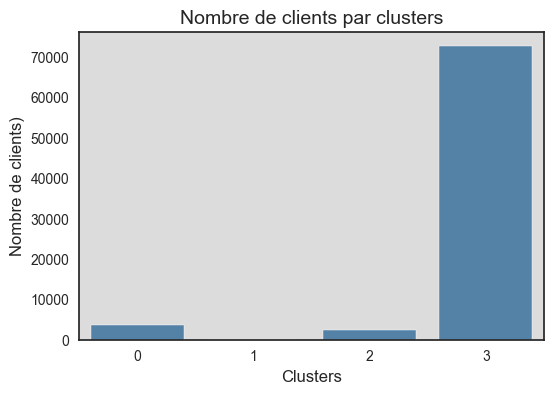

In [45]:
affiche_clients_par_clusters(kmeans_4_labels)

In [50]:

df_interpret_k4 = \
    data_kmeans.groupby('Cluster_4').agg({'rfm_recence' : 'mean',
                                          'rfm_frequence' : 'mean',
                                          'rfm_montant' : 'mean',
                                          'note_avis_mean' : 'mean',
                                          'nbr_commandes' : 'mean',
                                          'nbr_articles_mean' : 'mean',
                                          'panier_moyen': 'mean',
                                          'echeance_paiement_mean' : 'median',
                                          'frais_port_mean' : 'mean'})
df_interpret_k4.reset_index(inplace = True)
df_interpret_k4.head()


,Cluster_4,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,228.465649,1.004089,786.498411,4.058342,1.012268,1.000000,679.053317,8.0,50.150304
1,1,264.700000,1.000000,213.551000,2.650000,1.000000,2.150000,50.872500,1.0,14.461500
2,2,217.129903,2.107128,285.662269,4.229282,5.307043,1.000422,100.448183,2.0,17.680355
3,3,236.200585,1.000000,119.948724,4.180333,1.000000,1.000000,93.950305,1.0,16.844052


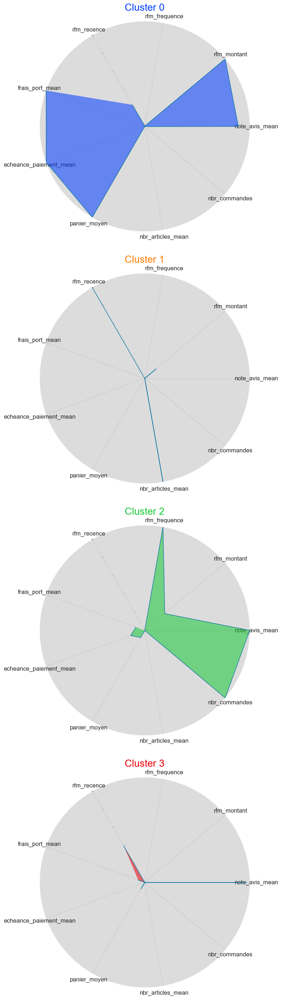

In [51]:
affiche_radarplot_par_clusters(df_interpret_k4,'Cluster_4', 4, 1)

**Bilan** :
***
- **Cluster 0** : Commandes moins récentes, moyennement fréquentes avec une bonne moyenne de montant ==> **Bon client sur le point de dormir**.
- **Cluster 1** : commandes très anciennes, moyennement fréquentes et d'un montant correct, dernier achat très anciens ==> **Clients en hibernation ou perdus**.    
- **Cluster 2** : commandes très récentes, peu fréquentes et d'un faible montant ==> **nouveaux clients**.
- **Cluster 3** : commandes récentes, fréquentes et d'un bon montant ==> **meilleurs clients**.

**Segmentation k-Means avec k=5**

In [46]:
# Dataframe de sauvegarde des résultats des métriques KMeans
df_metrics_kmeans_k_5 = pd.DataFrame()

In [47]:
# Tuning hyperparametres n_init et init
# Métriques pour les données quantitatives standardisées, non transformées
# en logarithme
n_clusters = [5]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans_k_5 = calcul_metrics_kmeans(X_scaled,
                                              df_metrics_kmeans_k_5,
                                              'Kmeans 5 clusters', seed,
                                              n_clusters, n_init, init)
df_metrics_kmeans_k_5.style.hide()

Type_données,nbr_clusters,n_init,type_init,coef_silh,dispersion,Durée (s)
Kmeans 5 clusters,5,10,k-means++,0.167736,545807.222825,1.724998
Kmeans 5 clusters,5,10,random,0.216966,562869.545907,1.095310
Kmeans 5 clusters,5,20,k-means++,0.167736,545807.222825,2.701944
Kmeans 5 clusters,5,20,random,0.217039,562862.659236,2.082099
Kmeans 5 clusters,5,30,k-means++,0.167736,545807.222825,3.886504
Kmeans 5 clusters,5,30,random,0.217039,562862.659236,2.916920
Kmeans 5 clusters,5,50,k-means++,0.167736,545807.222825,6.485853
Kmeans 5 clusters,5,50,random,0.218472,562861.834931,4.484957
Kmeans 5 clusters,5,70,k-means++,0.167736,545807.222825,8.712486
Kmeans 5 clusters,5,70,random,0.218472,562861.834931,6.165426


**Bilan** :
***
Les meilleurs scores sont trouvés pour :
- n_init=50 : c'est pas la valeur par défaut.
- init=k-means++ (pas la valeur par défaut 'random').

In [48]:
%%time
# Instanciation du modèle KMeans pour 5 clusters  + meilleurs paramètres
kmeans_5 = KMeans(n_clusters=5, init='k-means++', random_state=seed,n_init= 50)
clusters_km_5 = kmeans_5.fit(X_scaled)
# Ajout de l'assignation du cluster au dataframe
X_scaled['Cluster_5'] = kmeans_5.labels_
kmeans_5_labels = kmeans_5.labels_

CPU times: user 16.2 s, sys: 1.85 s, total: 18 s
Wall time: 6.35 s


In [49]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_kmeans['Cluster_5'] = kmeans_5.labels_

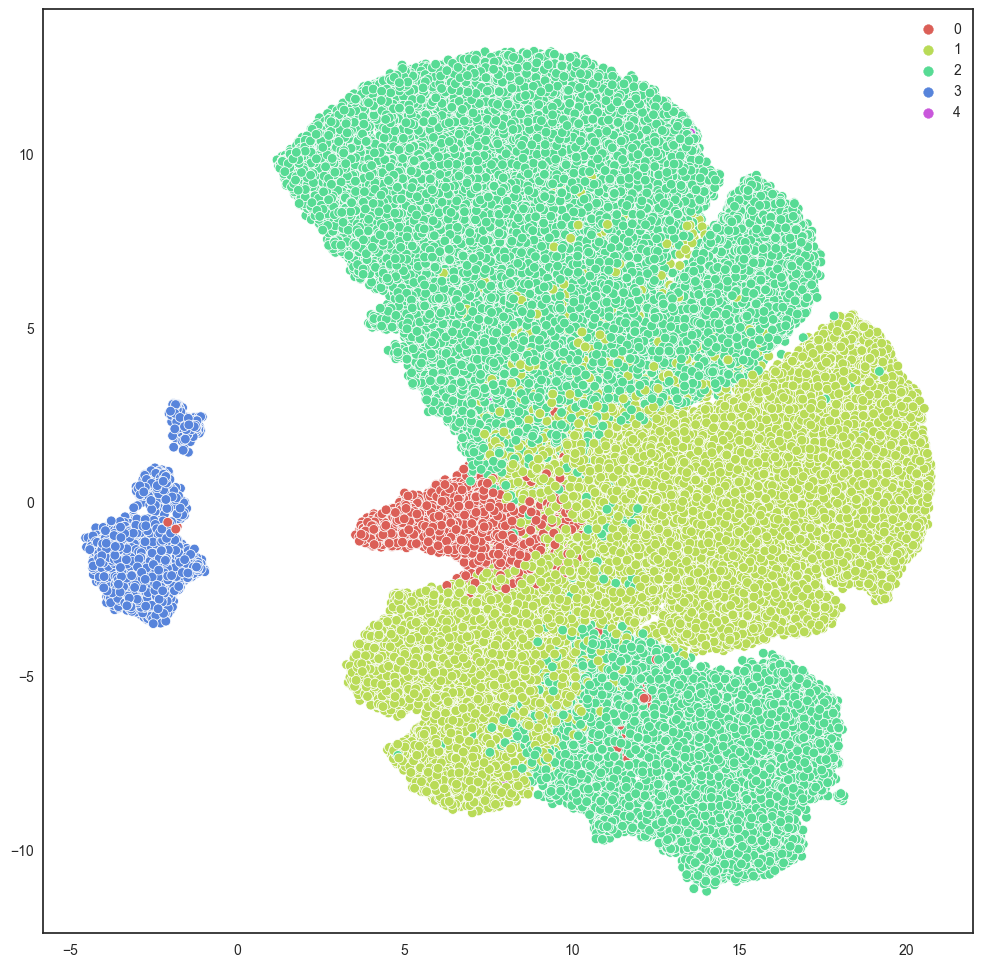

In [50]:
# Visualisation en 2D avec UMAP
affiche_umap_par_clusters(X_projected_umap, kmeans_5_labels, 5)

Clusters,Nb_clients,%
0,2774,3.530000
1,32524,41.380000
2,40910,52.050000
3,2369,3.010000
4,20,0.030000


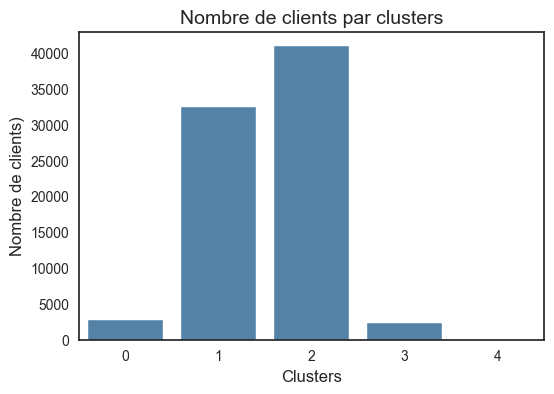

In [51]:
affiche_clients_par_clusters(kmeans_5_labels)

In [52]:
#%pycodestyle_off
df_interpret_k5 = \
    data_kmeans.groupby('Cluster_5').agg({'rfm_recence' : 'mean',
                                          'rfm_frequence' : 'mean',
                                          'rfm_montant' : 'mean',
                                          'note_avis_mean' : 'mean',
                                          'nbr_commandes' : 'mean',
                                          'nbr_articles_mean' : 'mean',
                                          'panier_moyen': 'mean',
                                          'echeance_paiement_mean' : 'median',
                                          'frais_port_mean' : 'mean'})
df_interpret_k5.reset_index(inplace = True)
df_interpret_k5.head()

,Cluster_5,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,229.750541,1.006128,902.791658,4.129776,1.019827,1.000000,789.472808,8.0,52.161141
1,1,249.752952,1.000000,141.045590,3.742529,1.000000,1.000000,108.672016,2.0,19.653984
2,2,225.162185,1.000000,109.919560,4.520900,1.000000,1.000000,87.571815,1.0,15.203892
3,3,217.250739,2.107218,284.720114,4.229054,5.306458,1.000422,99.995038,2.0,17.641567
4,4,264.700000,1.000000,213.551000,2.650000,1.000000,2.150000,50.872500,1.0,14.461500


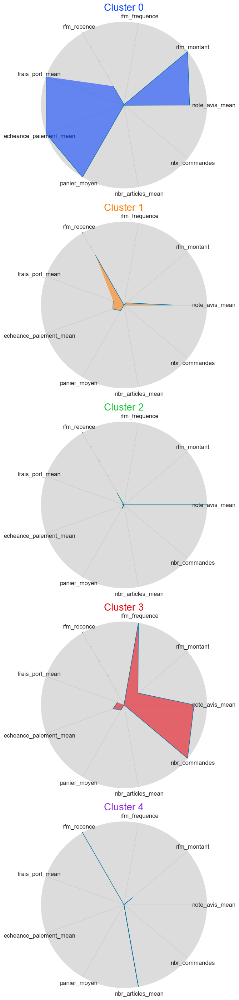

In [53]:
affiche_radarplot_par_clusters(df_interpret_k5,'Cluster_5', 5, 1)

**Bilan** :
***
- **Cluster 0** : commandes anciennes, peu fréquentes et d'un montant moyen bas, dernier achat très anciens ==> **clients presque perdus**.    
- **Cluster 1** : commandes assez récentes, peu fréquentes et d'un montant moyen ==> **Bons clients sur le point de dormir**.
- **Cluster 2** : commandes très récentes, peu fréquentes et d'un montant moyen bas ==> **nouveaux clients**.
- **Cluster 3** : commandes assez récentes, fréquentes et d'un montant élevé ==> **meilleurs clients fidèles**.
- **Cluster 4** : commandes assez récentes, fréquentes et d'un montant élevé, utilisation d'un grand nombre d'échelonnement de paiement ==> **meilleurs clients utilisant des facilités de paiement**.

### <span style='background:'>6.2  K-Means : Variables quantitatives+qualitatives </span>

Dans la suite de cette section , au vu des deux methodes nous allons tester avec 6 clusters

**Recherche des hyperparametres**

In [54]:
# Dataframe de sauvegarde des résultats des métriques KMeans
df_metrics_kmeans_k_6 = pd.DataFrame()

In [62]:
# Tuning hyperparametres n_init et init
# Métriques pour les données quantitatives standardisées, non transformées
# en logarithme + les données qualitatives
# Paramètres à tester
n_clusters = [6]
n_init = [10, 20, 30, 50, 70, 80, 100]
init = ['k-means++', 'random']
# Métriques avec les différentes combinaisons des paramètres
df_metrics_kmeans_k_6 = calcul_metrics_kmeans(X_scaled_cat, df_metrics_kmeans_k_6,
                                              'Kmeans quali 6 clusters',seed, n_clusters, n_init, init)
df_metrics_kmeans_k_6.style.hide()

Type_données,nbr_clusters,n_init,type_init,coef_silh,dispersion,Durée (s)
Kmeans quali 6 clusters,6,10,k-means++,0.172984,536225.985913,6.798893
Kmeans quali 6 clusters,6,10,random,0.158375,575454.310840,4.888440
Kmeans quali 6 clusters,6,20,k-means++,0.172984,536225.985913,11.983251
Kmeans quali 6 clusters,6,20,random,0.158375,575454.310840,9.259685
Kmeans quali 6 clusters,6,30,k-means++,0.172984,536225.985913,17.107021
Kmeans quali 6 clusters,6,30,random,0.158375,575454.310840,16.527860
Kmeans quali 6 clusters,6,50,k-means++,0.172984,536225.985913,26.418553
Kmeans quali 6 clusters,6,50,random,0.158375,575454.310840,21.872962
Kmeans quali 6 clusters,6,70,k-means++,0.172984,536225.985913,52.810817
Kmeans quali 6 clusters,6,70,random,0.158375,575454.310840,39.147373


**Bilan** :
***
Les meilleurs scores sont trouvés pour :
- n_init=100 (10=la valeur par défaut).
- init=k-means++ ( la valeur par défaut='random').

**Instanciation du modèle KMeans avec k=6 et les meilleurs hyperparamètres**

In [55]:
%%time
# Instanciation du modèle KMeans pour 6 clusters et  meilleurs paramètres
kmeans_6 = KMeans(n_clusters=6, n_init=100, init='k-means++',
                  random_state=seed).fit(X_scaled_cat)
kmeans_6_labels = kmeans_6.labels_

CPU times: user 1min 50s, sys: 5.55 s, total: 1min 56s
Wall time: 51.5 s


In [56]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_kmeans = data.copy()
data_kmeans['Cluster_6'] = kmeans_6.labels_

Clusters,Nb_clients,%
0,34628,44.060000
1,24300,30.920000
2,22,0.030000
3,9298,11.830000
4,2384,3.030000
5,7965,10.130000


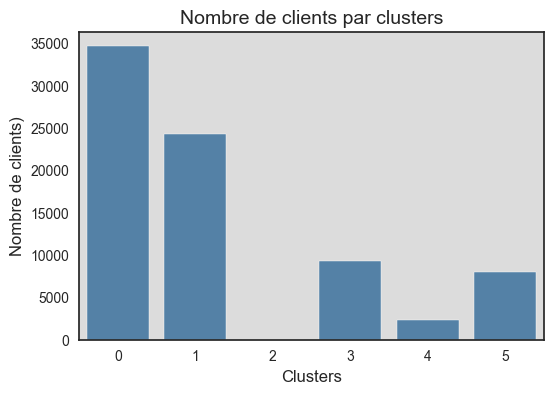

In [57]:
affiche_clients_par_clusters(kmeans_6_labels)

**Interprétataion des 6 clusters**

In [58]:
df_interpret_k6 = \
    data_kmeans.groupby('Cluster_6').agg({'rfm_recence' : 'mean',
                                          'rfm_frequence' : 'mean',
                                          'rfm_montant' : 'mean',
                                          'note_avis_mean' : 'mean',
                                          'nbr_commandes' : 'mean',
                                          'nbr_articles_mean' : 'mean',
                                          'panier_moyen': 'mean',
                                          'echeance_paiement_mean' : 'median',
                                          'frais_port_mean' : 'mean',
                                          'moyen_paiement' : lambda x: x.mode()[0],
                                          'cat_produit_prefere' : lambda x: x.mode()[0],
                                          'geolocation_lat' : 'median',
                                          'geolocation_lng' : 'median'})
df_interpret_k6.reset_index(inplace = True)
df_interpret_k6.head()

,Cluster_6,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean,moyen_paiement,cat_produit_prefere,geolocation_lat,geolocation_lng
0,0,233.636075,1.000000,68.717098,4.568673,1.000000,1.000000,52.390012,1.0,13.368139,credit_card,beleza_saude,-23.016399,-46.615788
1,1,234.979424,1.000000,275.057672,4.533868,1.000000,1.000000,231.572632,4.0,24.852437,credit_card,cama_mesa_banho,-22.850417,-46.525297
2,2,271.954545,1.090909,203.732727,2.727273,1.454545,2.090909,50.290455,1.5,14.829545,credit_card,cama_mesa_banho,-23.540944,-46.669284
3,3,248.990213,1.000000,137.985037,4.343837,1.000000,1.000000,108.283296,1.0,20.799857,credit_card,cama_mesa_banho,-27.609382,-51.128339
4,4,217.130453,2.106544,297.798310,4.231387,5.298238,1.000000,105.927855,2.0,17.946119,credit_card,cama_mesa_banho,-23.123518,-46.638933


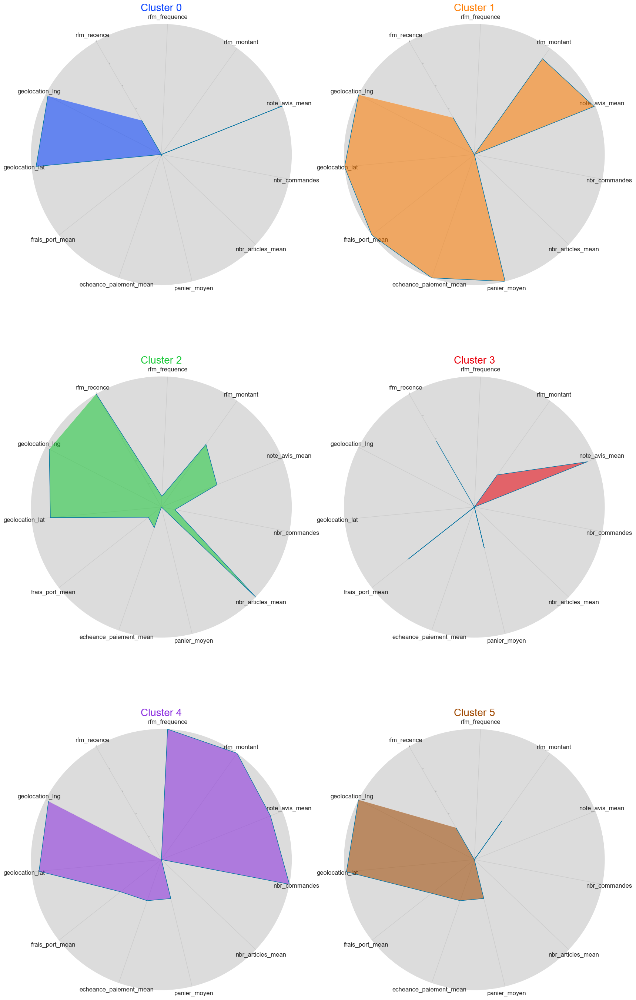

In [66]:
df_interpret_k6_red = df_interpret_k6.drop(columns=['moyen_paiement','cat_produit_prefere'])
affiche_radarplot_par_clusters(df_interpret_k6_red,'Cluster_6', 3, 2)

**Bilan** :
***
- **Cluster 0** : commandes anciennes, assez fréquentes et d'un montant élevé, dernier achat très anciens ==> **Meilleurs clients utilisant les facilités de paiement ayant besoin d'attention**.    
- **Cluster 1** : commandes assez récentes, peu fréquentes et d'un faible montant ==> **Nouveaux clients**.
- **Cluster 2** : commandes assez anciennes, très fréquentes et d'un montant élevé ==> **Meilleurs clients (hors nord) ayant besoin d'attention**.
- **Cluster 3** : commandes anciennes, assez fréquentes et d'un montant moyen, dernier achat très anciens ==> **Clients fidèles du Nord du Brésil ayant besoin d'attention**.    
- **Cluster 4** : commandes très récentes, assez fréquentes et d'un montant moyen ==> **Clients fidèles**.
- **Cluster 5** : commandes très anciennes, peu fréquentes et d'un montant moyen ==> **Clients perdus**.

**Distinctivité des clusters : score F1**

In [59]:

# Transforme les variables objects en category
lgbm_data = df_clients_cat.copy()
for c in lgbm_data.select_dtypes(include='object'):
    lgbm_data[c] = lgbm_data[c].astype('category')

# KMeans clusters
clf_km = LGBMClassifier(colsample_by_tree=0.8)
cv_scores_km = cross_val_score(clf_km, lgbm_data, kmeans_6_labels,
                               scoring='f1_weighted')
print(f'CV F1 score for K-Means clusters = {np.mean(cv_scores_km)}')

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3143
[LightGBM] [Info] Number of data points in the train set: 62877, number of used features: 14
[LightGBM] [Info] Start training from score -0.819676
[LightGBM] [Info] Start training from score -1.173848
[LightGBM] [Info] Start training from score -8.215722
[LightGBM] [Info] Start training from score -2.134578
[LightGBM] [Info] Start training from score -3.495125
[LightGBM] [Info] Start tra

In [60]:
np.mean(cv_scores_km)

0.9342084585259849

- Le score F1 pour K-Means est de 0.9342 ce qui signifie que les clients sont regroupés en **groupes significatifs et distinguables**.

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3295
[LightGBM] [Info] Number of data points in the train set: 78597, number of used features: 15
[LightGBM] [Info] Start training from score -0.819671
[LightGBM] [Info] Start training from score -1.173857
[LightGBM] [Info] Start training from score -8.181046
[LightGBM] [Info] Start training from score -2.134534
[LightGBM] [Info] Start training from score -3.495554
[LightGBM] [Info] Start tra

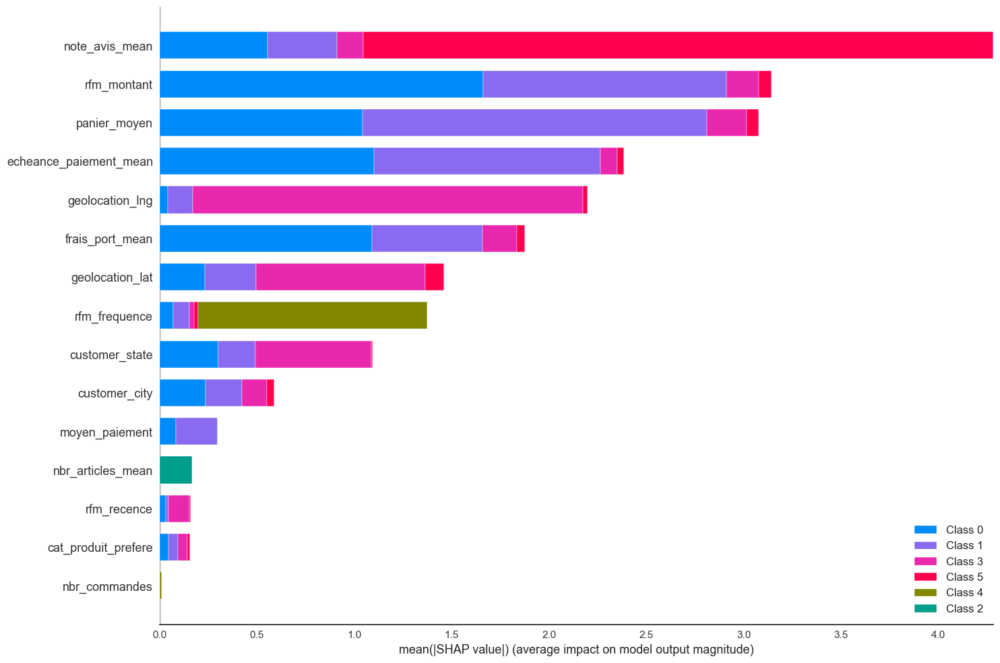

In [61]:
# Entraînement du modèle
clf_km.fit(lgbm_data, kmeans_6_labels)

# Feature importances avec SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(lgbm_data)
shap.summary_plot(shap_values_km, lgbm_data, plot_type='bar',
                  plot_size=(15, 10))

In [64]:
def affiche_variables_par_clusters(dataframe, var_cluster):
    '''
    Affiche les moyennes des variables par clusters.
    Parameters
    ----------
    dataframe : dataframe à interpréter, obligatoire
    Returns
    -------
    None.
    '''

    cols = dataframe.columns.to_list()
    cols.remove(var_cluster)

    sns.set_style('white')

    for col in cols:
        g = sns.catplot(data=dataframe, kind='bar', x=var_cluster, y=col,
                        ci='sd', alpha=.6, height=5, palette='bright')
        g.set_axis_labels("", col)
        plt.title(col, fontsize=20)
        plt.show()

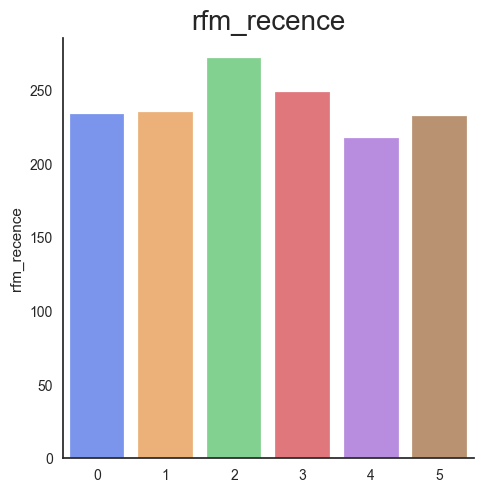

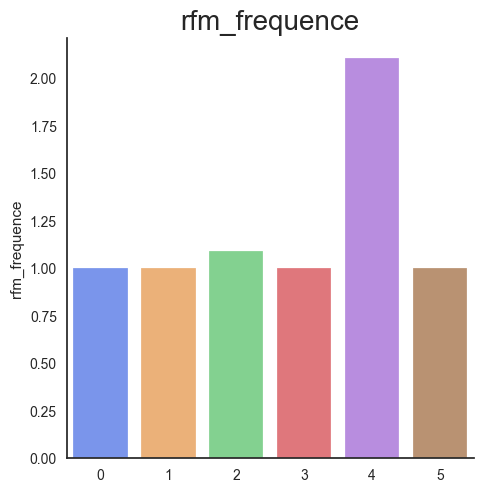

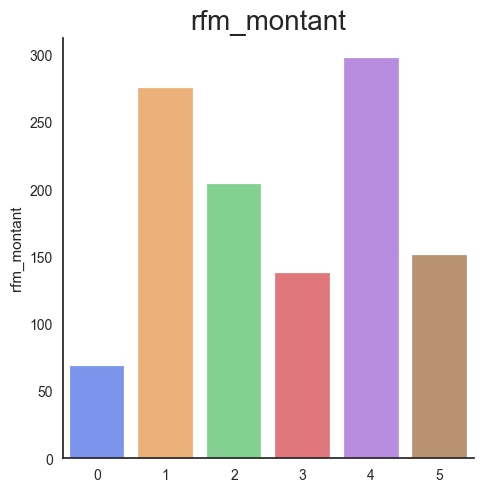

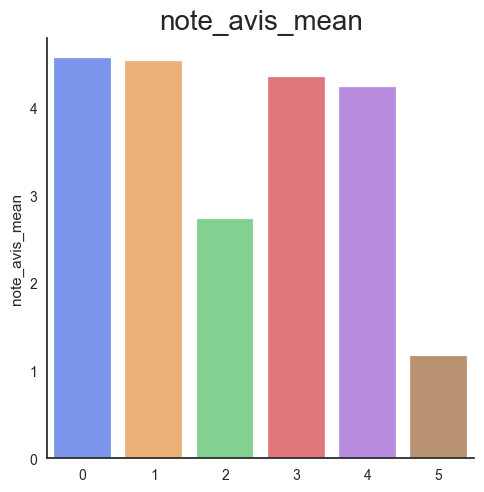

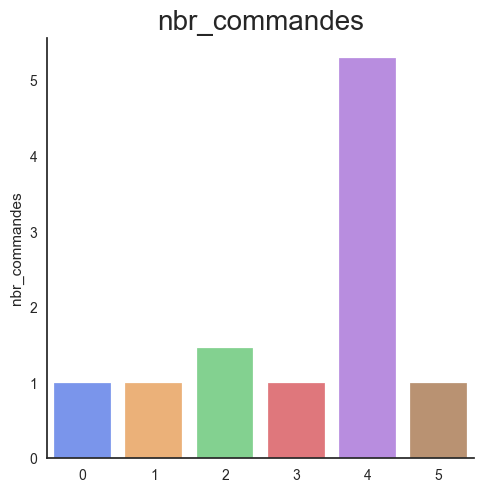

...

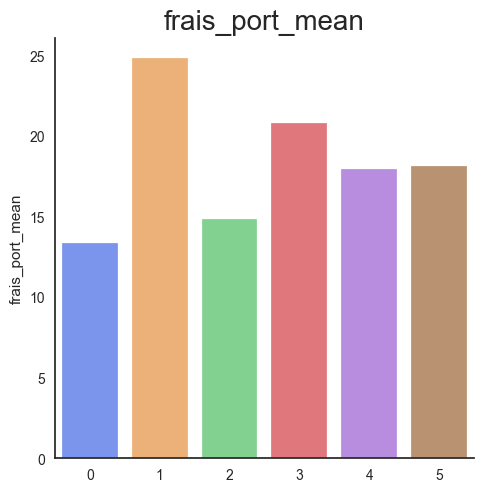

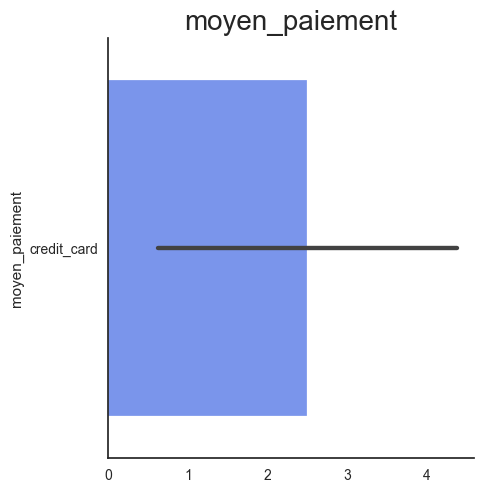

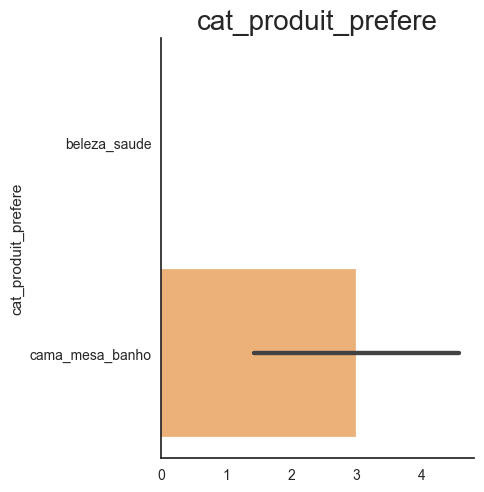

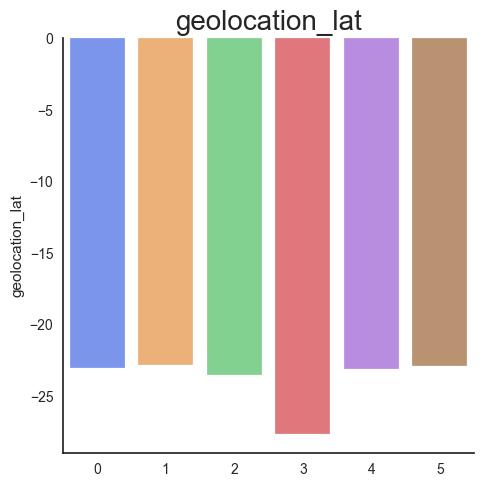

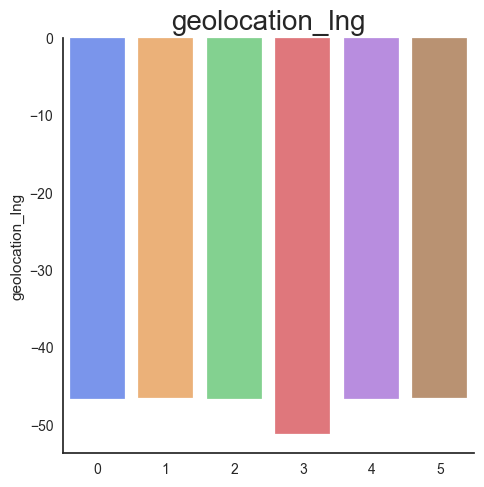

In [65]:
affiche_variables_par_clusters(df_interpret_k6, 'Cluster_6')

**Bilan** :
***
- K-Means permet de segmenter les clients en 6 groupes distinctifs et informatifs. Nous avons la confirmation grâce aux features importances que les 2 variables catégorielles n'ont que peu d'importance dans la segmentation de clientèles. 96% des clients paient en carte de crédit et la répartition de la catégorie des produits est différentes selon les groupes de clients.

## <span style='background:#33B5FF'>7. Clustering hiérachique : CAH </span>

**Note** :
***
- La classification ascendante hiérarchique est dite "ascendante" car elle part d'une situation où tous les individus sont seuls dans une classe, puis sont rassemblés en classes de plus en plus grandes. Le qualificatif hiérarchique vient du fait qu'elle produit une hiérarchie H, l'ensemble des classes à toutes les étapes de l'algorithme, qui vérifie les propriétés suivantes :
    - au sommet de la hiérarchie, lorsqu'on groupe de manière à obtenir une seule classe, tous les individus sont regroupés ;
    - en bas de la hiérarchie, tous les individus se trouvent seuls ;
    - si l’on considère deux classes du regroupement, alors soit elles n'ont pas d’individu en commun, soit l'une est incluse dans l’autre.
- La méthode suppose qu'on dispose d'une mesure de dissimilarité entre les individus; dans le cas de points situés dans un espace euclidien, on peut utiliser la distance comme mesure de dissimilarité.

**Hyperparamètres** :
***
- **n_clusters** : int ou None, default=2, le nombre de clusters à trouver. Il doit être None si distance_threshold n'est pas None.
- **affinity** : str ou appelable, par défaut='euclidienne'. Métrique utilisée pour calculer le lien. Peut être "euclidienne", "l1", "l2", "manhattan", "cosinus" ou "précalculée". Si le lien est "ward", seul "euclidien" est accepté. Si "precomputed", une matrice de distance (au lieu d'une matrice de similarité) est nécessaire comme entrée pour la méthode d'ajustement.
- **linkage** : {'ward', 'complete', 'average', 'single'}, default='ward', lLe critère de liaison à utiliser. Le critère de liaison détermine la distance à utiliser entre les ensembles d'observations. L'algorithme fusionnera les paires de cluster qui minimisent ce critère.
    - 'ward' minimise la variance des clusters fusionnés.
    - 'average' utilise la moyenne des distances de chaque observation des deux ensembles.
    - Le lien 'complet' ou 'maximum' utilise les distances maximales entre toutes les observations des deux ensembles.
    - single' utilise le minimum des distances entre toutes les observations des deux ensembles.

In [77]:
# Impossible de lancer CAH sur plus de 35000 clients à cause de problème
# de mémoire ==> on lance sur 15000 clients
data_reduit = X_scaled.sample(15000, random_state=seed).copy()
X_reduit = data_reduit.values
X_names = data_reduit.index

In [78]:
# Impossible de lancer CAH sur plus de 35000 clients à cause de problème
# de mémoire ==> on lance sur 15000 clients
data_reduit_cat = X_scaled_cat.sample(15000, random_state=seed).copy()
X_reduit_cat = data_reduit_cat.values
X_names_cat = data_reduit_cat.index

In [79]:
# Dataframe de sauvegarde des résultats des métriques CAH
df_metrics_cah = pd.DataFrame()

In [80]:
def calcul_metrics_cah(data, dataframe_metrique, type_donnees,
                       random_seed, param_grid):
    '''
    Calcul des métriques de CAH en fonction de différents paramètres.
    Parameters
    ----------
    data : données, obligatoire.
    dataframe_metrique : dataframe de sauvegarde des résultats, obligatoire.
    type_donnees : string intitulé des données, obligatoire.
    random_seed : nombre aléatoire pour la reproductibilité, obligatoire.
    param_grid : la grille contenant les paramètres à optimiser.
    Returns
    -------
    dataframe_metrique : résultat des métriques
    '''
    # Cette fonction permet de calculer le nombre de clusters le plus
    # optimal pour notre analyse : le coefficient de silhouette,
    # indice de davies_bouldin, indice de Calinsky-Harabasz
    silhouette = []
    davies_bouldin = []
    calin_harab = []
    donnees = []
    temps = []

    result_nclusters = []
    result_linkage = []
    result_affinity = []

    # Hyperparametre tuning
    n_clusters = param_grid[0]
    linkage = param_grid[1]
    affinity = param_grid[2]

    # Tester le modèle avec les différentes combinaisons de paramètres
    for nb_clusters in n_clusters:

        for link in linkage:

            for affinite in affinity:

                # Top début d'exécution
                time_start = time.time()

                # Initialisation de l'algorithme
                cah = AgglomerativeClustering(n_clusters=nb_clusters,
                                              linkage=link,
                                              affinity=affinite)

                # Entraînement de l'algorithme / Prédictions
                preds = cah.fit_predict(data)

                # Top fin d'exécution
                time_end = time.time()

                # Calcul du score de coefficient de silhouette
                silh = silhouette_score(data, preds)
                # Calcul de l'indice davies-bouldin
                db = davies_bouldin_score(data, preds)
                # Calcul de l'indice  Calinski_harabasz
                cal_har = calinski_harabasz_score(data, preds)
                # Durée d'exécution
                time_execution = time_end - time_start

                silhouette.append(silh)
                davies_bouldin.append(db)
                calin_harab.append(cal_har)
                donnees.append(type_donnees)
                temps.append(time_execution)

                result_nclusters.append(nb_clusters)
                result_linkage.append(link)
                result_affinity.append(affinite)

    dataframe_metrique = dataframe_metrique._append(pd.DataFrame({
        'Type_données': donnees,
        'n_clusters': result_nclusters,
        'linkage': result_linkage,
        'affinity': result_affinity,
        'coef_silh': silhouette,
        'davies_bouldin': davies_bouldin,
        'calinski_harabasz': calin_harab,
        'Durée (s)': temps
    }), ignore_index=True)

    return dataframe_metrique

In [81]:
# Tuning hyperparametres n_clusters, linkage, metric
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées non-transformées
# en logarithme
n_clusters = range(3, 10)
linkage = ['complete', 'average', 'single']
metric = ['euclidean', 'manhattan', 'cosine']
param_grid_cah = [n_clusters, linkage, metric]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_cah = calcul_metrics_cah(X_reduit,
                                           df_metrics_cah,
                                           'CAH quant', seed,
                                           param_grid_cah)
df_metrics_cah.style.hide()

Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
CAH quant,3,complete,euclidean,0.756383,0.425517,801.505361,15.916952
CAH quant,3,complete,manhattan,0.556626,0.819893,1647.133743,13.224436
CAH quant,3,complete,cosine,0.129447,2.074408,1729.474979,11.785993
CAH quant,3,average,euclidean,0.870380,0.221470,573.476980,13.053295
CAH quant,3,average,manhattan,0.868654,0.325891,557.201059,12.935793
CAH quant,3,average,cosine,0.272076,1.416517,1316.442711,12.688560
CAH quant,3,single,euclidean,0.889296,0.080837,450.643482,3.710954
CAH quant,3,single,manhattan,0.894157,0.079771,456.570887,3.413045
CAH quant,3,single,cosine,0.213312,0.482093,386.017366,4.553558
CAH quant,4,complete,euclidean,0.756337,0.445511,737.145536,13.767804


In [83]:
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
n_clusters = range(3, 10)
linkage = ['ward']
metric = ['euclidean']
param_grid_cah_2 = [n_clusters, linkage, metric]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_cah = calcul_metrics_cah(X_reduit_cat,
                                           df_metrics_cah,
                                           'CAH quant log', seed,
                                           param_grid_cah_2)
df_metrics_cah.style.hide()

Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
CAH quant,3,complete,euclidean,0.756383,0.425517,801.505361,15.916952
CAH quant,3,complete,manhattan,0.556626,0.819893,1647.133743,13.224436
CAH quant,3,complete,cosine,0.129447,2.074408,1729.474979,11.785993
CAH quant,3,average,euclidean,0.870380,0.221470,573.476980,13.053295
CAH quant,3,average,manhattan,0.868654,0.325891,557.201059,12.935793
CAH quant,3,average,cosine,0.272076,1.416517,1316.442711,12.688560
CAH quant,3,single,euclidean,0.889296,0.080837,450.643482,3.710954
CAH quant,3,single,manhattan,0.894157,0.079771,456.570887,3.413045
CAH quant,3,single,cosine,0.213312,0.482093,386.017366,4.553558
CAH quant,4,complete,euclidean,0.756337,0.445511,737.145536,13.767804


In [84]:
# Constitution du dataframes de visualisation
df_cah = \
    df_metrics_cah[df_metrics_cah['Type_données'] == 'CAH quant log']

In [85]:
def affiche_effet_clusters_score(dataframe, nclust_deb, nclust_fin, silh=True,
                                 davbou=True, calhar=True):
    '''
    Affiche les graphiques des différents scores des clusters.
    Parameters
    ----------
    dataframe : dataframe de résultats des métriques, obligatoire.
    nclust_deb : nombre de clusters minimum, obligatoire.
    nclust_fin : nombre de clusters maximum, obligatoire.
    silh : Affiche graphique score des silhouettes?, optionnel (défaut : True)
    davbou : Affiche graphique des indices de Davies-Bouldin?,
             optionnel (défaut : True)
    calhar : Affiche graphique des indices de Calinski-Harabasz?,
             optionnel (défaut : True)
    Returns
    -------
    None.
    '''
    if silh:
        # Trace le graphique des coefficient de silhouette
        plt.figure(figsize=(12, 5))

        s_silhouette = dataframe.groupby('n_clusters')['coef_silh'].mean()

        plt.title('Le coefficient de silhouette', fontsize=16)
        plt.plot([i for i in range(nclust_deb, nclust_fin)], s_silhouette,
                 marker='o')
        plt.grid(True)
        plt.xlabel('Nombre de groupes', fontsize=14)
        plt.ylabel('Silhouette score', fontsize=15)
        plt.xticks([i for i in range(nclust_deb, nclust_fin)], fontsize=14)
        plt.yticks(fontsize=15)

        plt.show()

    if davbou:
        # Trace le graphique des indices de davies-bouldin
        plt.figure(figsize=(12, 5))

        s_db = dataframe.groupby('n_clusters')['davies_bouldin'].mean()

        plt.title('L\'indice de Davies-Bouldin', fontsize=16)
        plt.plot([i for i in range(nclust_deb, nclust_fin)], s_db, marker='o')

        plt.grid(True)
        plt.xlabel('Nombre de groupes', fontsize=14)
        plt.ylabel('Indice de Davies-Bouldin', fontsize=15)
        plt.xticks([i for i in range(nclust_deb, nclust_fin)], fontsize=14)
        plt.yticks(fontsize=15)

        plt.show()

    if calhar:
        # Trace le graphique des indices de Calinski-Harabasz
        plt.figure(figsize=(12, 5))

        s_db = dataframe.groupby('n_clusters')['calinski_harabasz'].mean()

        plt.title('L\'indice de Calinski-Harabasz', fontsize=16)
        plt.plot([i for i in range(nclust_deb, 10)], s_db, marker='o')

        plt.grid(True)
        plt.xlabel('Nombre de groupes', fontsize=14)
        plt.ylabel('Indice de Calinski-Harabasz', fontsize=15)
        plt.xticks([i for i in range(nclust_deb, nclust_fin)], fontsize=14)
        plt.yticks(fontsize=15)

        plt.show()

In [86]:
# Constitution du dataframes de visualisation
df_cah = \
    df_metrics_cah[df_metrics_cah['Type_données'] == 'CAH quant log']

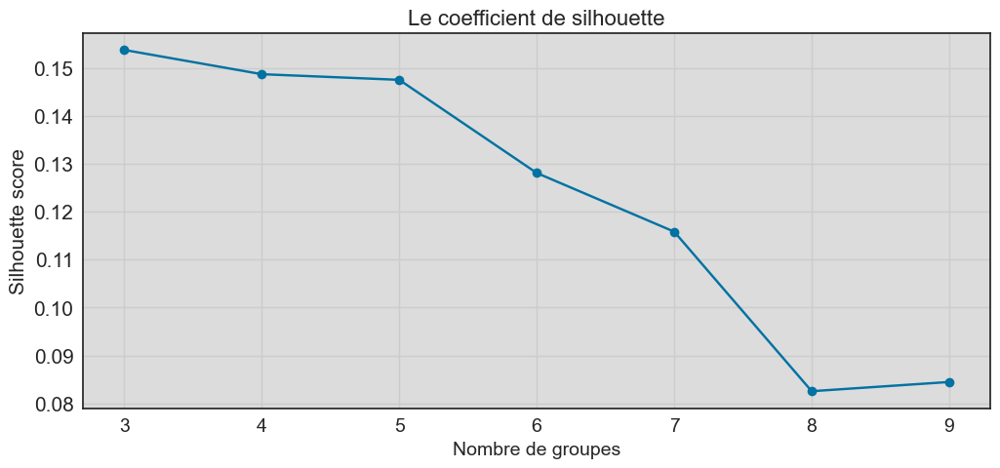

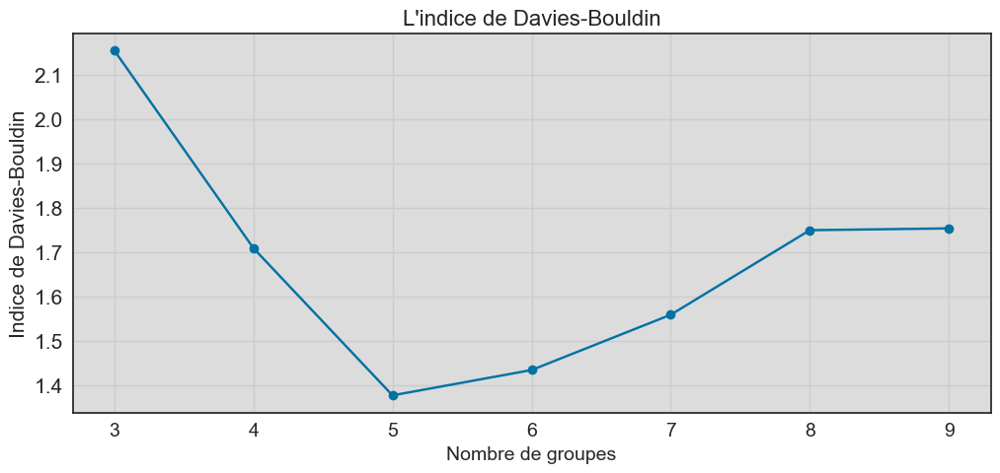

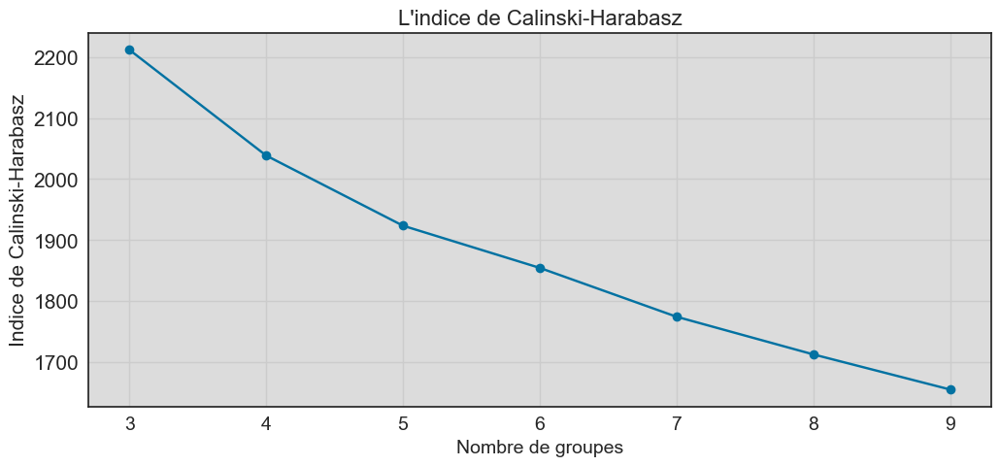

In [88]:
# Visualisation de l'effet des clusters sur les scores
affiche_effet_clusters_score(df_cah, 3, 10)

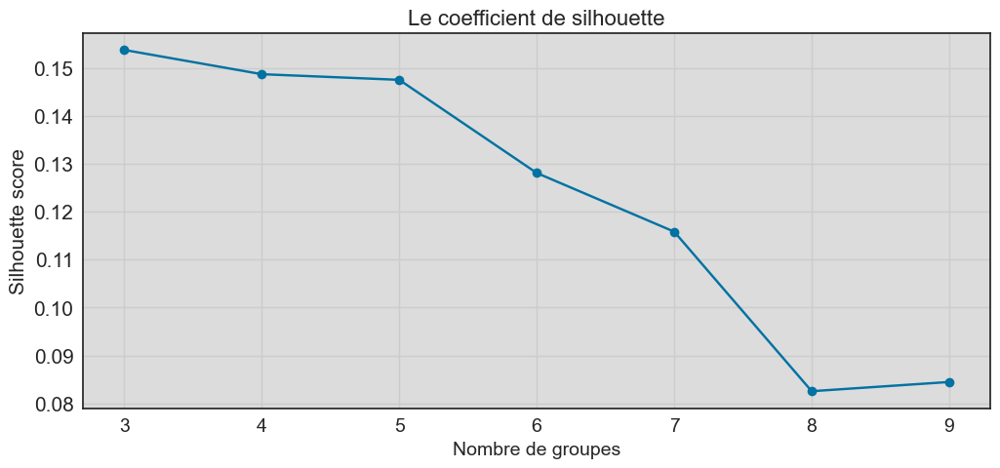

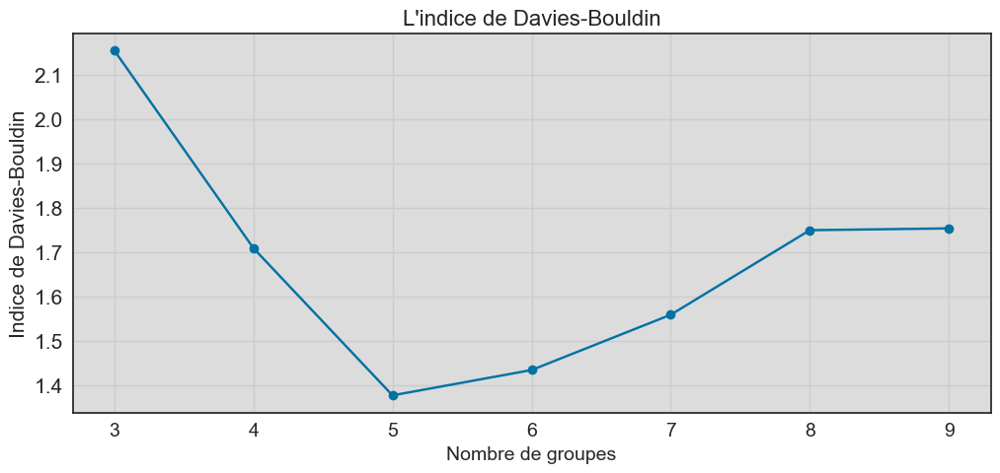

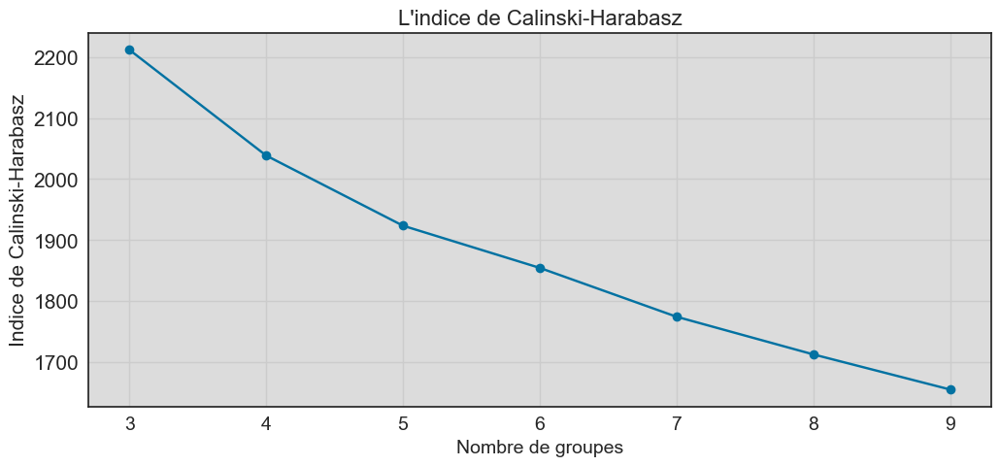

In [90]:
# Visualisation de l'effet des clusters sur les scores
affiche_effet_clusters_score(df_cah, 3, 10)

**Bilan** :
***
Les meilleurs hyperparamètres :
- n_clusters : 3.
- linkage : single.
- affinity : euclidean.

In [110]:
# Instanciation de cah avec les meilleurs paramètres
cah = AgglomerativeClustering(n_clusters=3,
                              linkage='single',
                              affinity='euclidean')
# Entraînement du modèle
cah.fit(X_reduit_cat)
cah_labels = cah.labels_

Clusters,Nb_clients,%
0,3,0.020000
1,466,3.110000
2,14531,96.870000


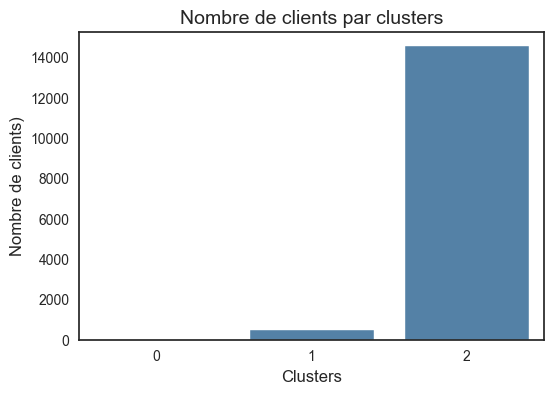

In [111]:
affiche_clients_par_clusters(cah_labels)

## <span style='background:#33B5FF'>8. Clustering de modélisation a base de densité : DBSCAN</span>

***Note*** :
***    
- DBSCAN est un apprentissage non supervisé non paramétrique basé sur la densité proposé en 1996 par Martin Ester, Hans-Peter Kriegel, Jörg Sander et Xiaowei Xu.
- Moins d'hypothèses, plus de flexibilité dans le modèle construit, une application plus large.
- Semblable à K-Means, DBSCAN regroupe les données en fonction de leurs similarités sur la base de fonctions de distance et de densité. La densité signifie ici le nombre de points dans la région définie par les paramètres du modèle.
- L'algorithme DBSCAN utilise 2 paramètres : la distance et le nombre minimum de points MinPts devant se trouver dans un rayon epsilon, pour que ces points soient considérés comme un cluster. Les paramètres d'entrées sont donc une estimation de la densité de points des clusters. L'idée de base de l'algorithme est ensuite, pour un point donné, de récupérer son epsilon-voisinage et de vérifier qu'il contient bien MinPts points ou plus. Ce point est alors considéré comme faisant partie d'un cluster. On parcourt ensuite l'epsilon -voisinage de proche en proche afin de trouver l'ensemble des points du cluster.
- L'algorithme fonctionne en calculant la distance entre chaque point et tous les autres points. Nous plaçons ensuite les points dans l'une des trois catégories suivantes.
     - Point central : un point avec au moins min_échantillons de points dont la distance par rapport au point est inférieure au seuil défini par epsilon.
    - Point frontière : un point qui n'est pas à proximité d'au moins min_échantillons de points mais qui est suffisamment proche d'un ou plusieurs points centraux. Les points limites sont inclus dans le cluster du point central le plus proche.
    - Point de bruit : points qui ne sont pas assez proches des points centraux pour être considérés comme des points limites. Les points de bruit sont ignorés. C'est-à-dire qu'ils ne font partie d'aucun cluster.

**Hyperparamètres** :
- **eps** : définit le voisinage d'un point, x, ou le rayon d'un cercle (ou d'une hypersphère dans l'espace N-D) avec x comme centre. Deux points sont considérés comme voisins si la distance entre les deux points est inférieure au seuil epsilon.
- **minPts** : nombre minimum de points dans le voisinage pour former une région dense.
- **min_samples** : le nombre minimum de voisins qu'un point donné doit avoir pour être classé comme un point central. Il est important de noter que le point lui-même est inclus dans le nombre minimum d'échantillons.
- **metric** : la métrique à utiliser lors du calcul de la distance entre les instances d'un tableau de caractéristiques (c'est-à-dire la distance euclidienne).

In [91]:
# Arbitrage : nombre minimum de points dans le voisinage pour former une
# région dense : 2*dimension
minpts = 2*11

In [92]:

from sklearn.neighbors import NearestNeighbors
def recherche_epsilon(data, minpts):
    '''
    Recherche du meilleur paramètre epsilon pour paramétrage DBSCAN.
    Parameters
    ----------
    data : données, obligatoire..
    minpts : minimum de points de voisinage dans le rayon epsilon.
    Returns
    -------
    None.
    '''
    neigh = NearestNeighbors(n_neighbors=minpts)
    nbrs = neigh.fit(data)
    distances, indices = nbrs.kneighbors(data)

    distances = np.sort(distances, axis=0)
    distances = distances[:, 1]

    plt.figure(figsize=(5, 8))
    plt.plot(distances)
    plt.xlabel("Nbr clusters", size=14)
    plt.ylabel("Epsilon", size=14)
    plt.title("Evaluation Epsilon", size=14)


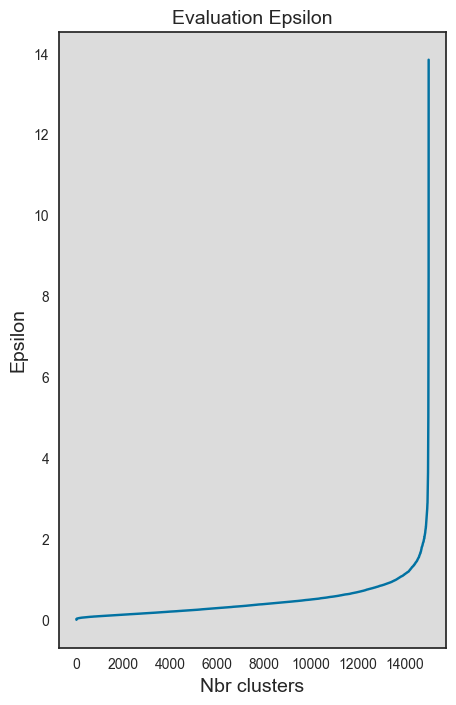

In [94]:
# Recherche du paramètre epsilon optimal
recherche_epsilon(X_reduit, minpts)

- Le paramètre eps optimal est obtenu où la tangente à la courbe est maximale : entre 1.5 et 2 pour la courbe ci-dessus.

In [95]:
def calcul_metrics_dbscan(data, dataframe_metrique, type_donnees,
                          random_seed, param_grid):
    '''
    Calcul des métriques de DBSCAN en fonction de différents paramètres.
    Parameters
    ----------
    data : données, obligatoire.
    dataframe_metrique : dataframe de sauvegarde des résultats, obligatoire.
    type_donnees : string intitulé des données, obligatoire.
    random_seed : nombre aléatoire pour la reproductibilité, obligatoire.
    param_grid : la grille contenant les paramètres à optimiser.
    Returns
    -------
    dataframe_metrique : résultat des métriques
    '''
    # Cette fonction permet de calculer le nombre de clusters le plus
    # optimal pour notre analyse : le coefficient de silhouette,
    # indice de davies_bouldin, indice de Calinsky-Harabasz
    silhouette = []
    davies_bouldin = []
    calin_harab = []
    donnees = []
    temps = []

    result_eps = []
    result_minsamples = []

    # Hyperparametre tuning
    eps = param_grid[0]
    min_samples = param_grid[1]
    n_jobs = param_grid[2]

    # Tester le modèle avec les différentes combinaisons de paramètres
    for epsilon in eps:

        for minsamples in min_samples:

            # Top début d'exécution
            time_start = time.time()

            # Initialisation de l'algorithme
            dbscan = DBSCAN(eps=epsilon,
                            min_samples=minsamples,
                            n_jobs=n_jobs)

            # Entraînement de l'algorithme / Prédictions
            preds = dbscan.fit_predict(data)

            # Top fin d'exécution
            time_end = time.time()

            # Calcul du score de coefficient de silhouette
            silh = silhouette_score(data, preds)
            # Calcul de l'indice davies-bouldin
            db = davies_bouldin_score(data, preds)
            # Calcul de l'indice  Calinski_harabasz
            cal_har = calinski_harabasz_score(data, preds)
            # Durée d'exécution
            time_execution = time_end - time_start

            silhouette.append(silh)
            davies_bouldin.append(db)
            calin_harab.append(cal_har)
            donnees.append(type_donnees)
            temps.append(time_execution)

            result_eps.append(epsilon)
            result_minsamples.append(minsamples)

    dataframe_metrique = dataframe_metrique._append(pd.DataFrame({
        'Type_données': donnees,
        'eps': result_eps,
        'min_samples': result_minsamples,
        'coef_silh': silhouette,
        'davies_bouldin': davies_bouldin,
        'calinski_harabasz': calin_harab,
        'Durée (s)': temps
    }), ignore_index=True)

    return dataframe_metrique

In [96]:
# Dataframe de sauvegarde des résultats des métriques CAH
df_metrics_dbscan = pd.DataFrame()

In [98]:
# Tuning hyperparametres eps, min_samples
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées non transformé
eps = [1, 1.5, 2, 2.5, 4]
min_samples = [10, 20, 30, 40, 50]
n_jobs = -1
param_grid_dbscan = [eps, min_samples, n_jobs]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_dbscan = calcul_metrics_dbscan(X_reduit_cat,
                                              df_metrics_dbscan,
                                              'DBSCAN quant log', seed,
                                              param_grid_dbscan)
df_metrics_dbscan.style.hide()

Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
DBSCAN quant log,1.000000,10,-0.315083,2.169494,19.056934,1.539599
DBSCAN quant log,1.000000,20,-0.303029,2.432363,21.599999,1.026029
DBSCAN quant log,1.000000,30,-0.283015,2.388303,22.975062,1.061758
DBSCAN quant log,1.000000,40,-0.280415,2.413902,22.124813,1.084861
DBSCAN quant log,1.000000,50,-0.229828,2.709152,13.063740,1.115731
DBSCAN quant log,1.500000,10,-0.092955,2.337525,130.359290,1.467161
DBSCAN quant log,1.500000,20,-0.021569,2.667186,133.351470,2.114309
DBSCAN quant log,1.500000,30,0.053976,4.670963,525.914730,2.087338
DBSCAN quant log,1.500000,40,0.027324,4.621578,491.150990,2.336185
DBSCAN quant log,1.500000,50,0.004555,4.618173,448.279357,2.093467


In [99]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_dbscan.sort_values(by='coef_silh', ascending=False).head(4)

,Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
22,DBSCAN quant log,4.0,30,0.515851,1.482817,1510.138585,5.978079
21,DBSCAN quant log,4.0,20,0.515851,1.482817,1510.138585,6.015586
24,DBSCAN quant log,4.0,50,0.515450,1.495127,1508.500048,6.011502
23,DBSCAN quant log,4.0,40,0.515450,1.495127,1508.500048,6.040959


In [100]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_dbscan.sort_values(by='davies_bouldin').head(4)

,Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
22,DBSCAN quant log,4.0,30,0.515851,1.482817,1510.138585,5.978079
21,DBSCAN quant log,4.0,20,0.515851,1.482817,1510.138585,6.015586
24,DBSCAN quant log,4.0,50,0.515450,1.495127,1508.500048,6.011502
23,DBSCAN quant log,4.0,40,0.515450,1.495127,1508.500048,6.040959


In [101]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_dbscan.sort_values(by='calinski_harabasz', ascending=False).head(4)

,Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
22,DBSCAN quant log,4.0,30,0.515851,1.482817,1510.138585,5.978079
21,DBSCAN quant log,4.0,20,0.515851,1.482817,1510.138585,6.015586
24,DBSCAN quant log,4.0,50,0.515450,1.495127,1508.500048,6.011502
23,DBSCAN quant log,4.0,40,0.515450,1.495127,1508.500048,6.040959


**Bilan** :
- Silhouette : eps=4, min_samples=30.
- Davies-Bouldin : eps=4, min_samples=30.
- Calinski-Harabsz : eps=4, min_samples=30.

On utilisera Les hyperparamètres :
- eps : 4.
- min_samples : 30.

In [102]:
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=4,
                min_samples=30,
                n_jobs=-1)
# Entraînement du modèle
dbscan.fit(X_reduit_cat)
dbscan_labels = dbscan.labels_

In [104]:
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=4,
                min_samples=30,
                n_jobs=-1)
# Entraînement du modèle
dbscan.fit(X_reduit_cat)
dbscan_labels = dbscan.labels_

Clusters,Nb_clients,%
-1,36,0.240000
0,14531,96.870000
1,433,2.890000


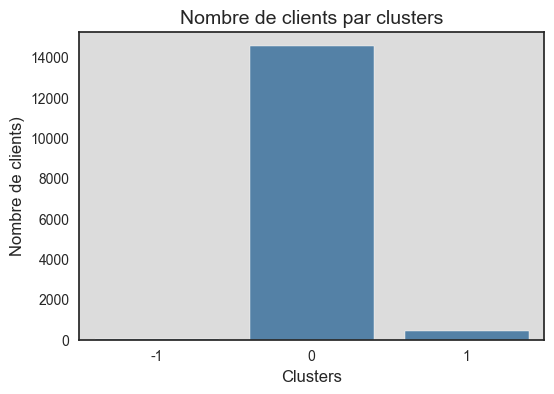

In [109]:
affiche_clients_par_clusters(dbscan_labels)

**Bilan** :
***
- DBSCAN ne parvient pas à segmenter les clients et ne trouve que 2  clusters et un cluster de bruit, avec les hyperparamètres par défaut. 
- Cela indique bien que le jeu de données est biaisé avec 96% de clients ayant effectué une seule commande.

## <span style='background:#33B5FF'>9. Comparaison des performances des algorithmes</span>

In [112]:
# Réduction du jeu de données à 10000 clients
# Préparation des jeux de données réduits à partir de X_scaled
data_comp = X_scaled.sample(10000, random_state=seed).copy()
X_comp = data_comp.values

# Préparation des jeux de données réduits à partir de X_scaled_cat
data_comp_cat = X_scaled_cat.sample(10000, random_state=seed).copy()
X_comp_cat = data_comp_cat.values



In [113]:
def calcul_comp_clustering(nom_algo, data, preds, dataframe_comparaison,
                           temps_exec):
    '''
    Calcul des métriques pour comparer les différents algorithmes de clustering.
    Parameters
    ----------
    nom_algo : nom de l'algorithme, obligatoire.
    data : données à analyser, obligatoire.
    preds : le résultat de la prédiction, obligatoire.
    dataframe_comparaison : dataframe de sauvegarde des résultats, obligatoire.
    temps_exec : temps d'exécution, obligatoire.
    Returns
    -------
    dataframe_metrique : résultat des métriques
    '''
    # Cette fonction permet de calculer le nombre de clusters le plus
    # optimal pour notre analyse : le coefficient de silhouette,
    # dispersion, indice de davies_bouldin
    silhouette = []
    davies_bouldin = []
    calin_harab = []
    algos = []
    temps = []
    nb_cluster = []

    nbcluster = len(set(preds))
    if nbcluster > 1:

        # Calcul du score de coefficient de silhouette
        silh = silhouette_score(data, preds)
        # Calcul de l'indice davies-bouldin
        db = davies_bouldin_score(data, preds)
        # Calcul de l'indice  Calinski_harabasz
        cal_har = calinski_harabasz_score(data, preds)

        silhouette.append(silh)
        davies_bouldin.append(db)
        calin_harab.append(cal_har)

    else:

        silhouette.append(0)
        davies_bouldin.append(00)
        calin_harab.append(0)

    algos.append(nom_algo)
    temps.append(temps_exec)
    nb_cluster.append(nbcluster)

    dataframe_comparaison = dataframe_comparaison._append(pd.DataFrame({
        'Algos': algos,
        'Nb_clusters': nb_cluster,
        'coef_silh': silhouette,
        'davies_bouldin': davies_bouldin,
        'calinski_harabasz': calin_harab,
        'Durée': temps
    }), ignore_index=True)

    return dataframe_comparaison

In [114]:
# Dataframe de comparaisons des performances des algorithmes
df_resultats_comp = pd.DataFrame()

In [115]:
# Variables quantitatives non-transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 3 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_3 = KMeans(n_clusters=3,
                  init='k-means++').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('K-Means-3',
                                               X_comp,
                                               kmeans_3,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034


In [116]:
# Variables quantitatives non-transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 4 clusters + meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_4 = KMeans(n_clusters=4,
                  init='k-means++',
                  random_state=seed).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('K-Means-4',
                                               X_comp,
                                               kmeans_4,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486


In [117]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 5 clusters  + meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_5 = KMeans(n_clusters=5,
                  init='k-means++').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('K-Means-5',
                                               X_comp,
                                               kmeans_5,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118


In [118]:
# Variables quantitatives transformées en log + quantitatives
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 6 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_6 = KMeans(n_clusters=6,
                  n_init=20,
                  init='k-means++').fit_predict(X_comp_cat)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('K-Means-6',
                                               X_comp_cat,
                                               kmeans_6,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118
K-Means-6,6,0.159848,1.573967,1539.842027,2.106762


In [119]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
cah_3 = AgglomerativeClustering(n_clusters=3,
                                linkage='single',
                                affinity='euclidean').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('CAH-3',
                                               X_comp,
                                               cah_3,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118
K-Means-6,6,0.159848,1.573967,1539.842027,2.106762
CAH-3,3,0.861788,0.189780,144.356888,1.072437


In [120]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec 4 clusters + meilleurs hyperparamètres
cah_4 = AgglomerativeClustering(n_clusters=4,
                                linkage='single',
                                affinity='manhattan').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('CAH-4',
                                               X_comp,
                                               cah_4,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118
K-Means-6,6,0.159848,1.573967,1539.842027,2.106762
CAH-3,3,0.861788,0.189780,144.356888,1.072437
CAH-4,4,0.849060,0.283107,125.487199,1.509727


In [121]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec 5 clusters + meilleurs hyperparamètres
cah_5 = AgglomerativeClustering(n_clusters=5,
                                linkage='single',
                                affinity='manhattan').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('CAH-5',
                                               X_comp,
                                               cah_5,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118
K-Means-6,6,0.159848,1.573967,1539.842027,2.106762
CAH-3,3,0.861788,0.189780,144.356888,1.072437
CAH-4,4,0.849060,0.283107,125.487199,1.509727
CAH-5,5,0.847810,0.244944,116.614999,1.397811


In [123]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=4,
                min_samples=10,
                n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('Dbscan-1',
                                               X_comp,
                                               dbscan,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118
K-Means-6,6,0.159848,1.573967,1539.842027,2.106762
CAH-3,3,0.861788,0.189780,144.356888,1.072437
CAH-4,4,0.849060,0.283107,125.487199,1.509727
CAH-5,5,0.847810,0.244944,116.614999,1.397811
Dbscan-1,4,0.487460,1.317367,587.788719,3.787756


In [124]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
dbscan_2 = DBSCAN(eps=3,
                  min_samples=10,
                  n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = calcul_comp_clustering('Dbscan-2',
                                               X_comp,
                                               dbscan_2,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.530003,1.082155,1719.694839,0.176034
K-Means-4,4,0.203589,1.517886,1881.768306,0.126486
K-Means-5,5,0.221475,1.443680,1821.472522,0.220118
K-Means-6,6,0.159848,1.573967,1539.842027,2.106762
CAH-3,3,0.861788,0.189780,144.356888,1.072437
CAH-4,4,0.849060,0.283107,125.487199,1.509727
CAH-5,5,0.847810,0.244944,116.614999,1.397811
Dbscan-1,4,0.487460,1.317367,587.788719,3.787756
Dbscan-2,5,0.473371,1.153617,555.013088,3.529167


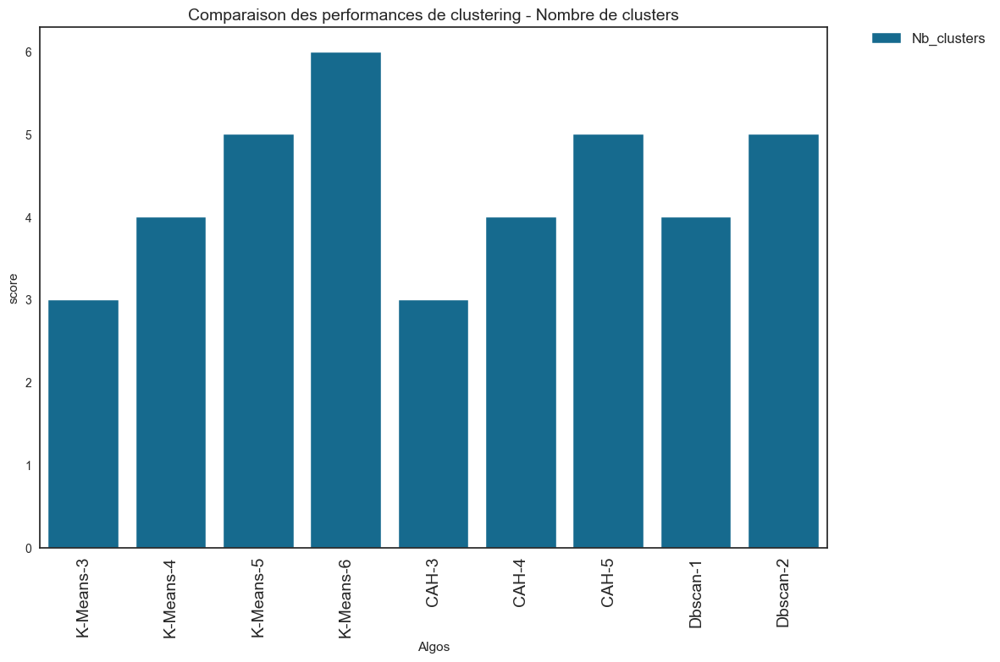

In [125]:
# Visualisation des nombres de clusters
# --------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['Nb_clusters'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Nombre de clusters',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

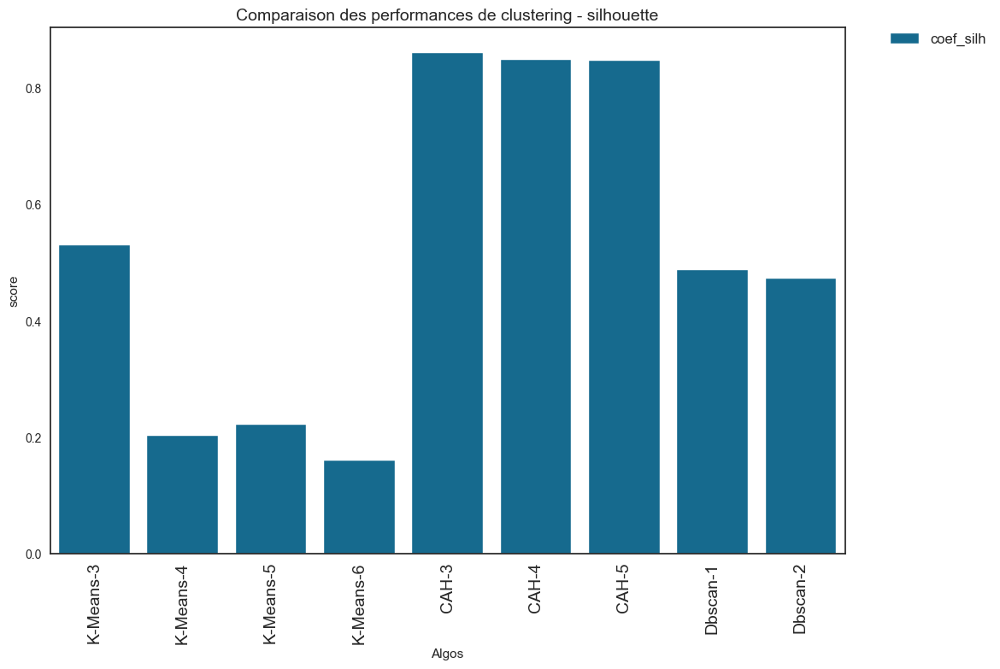

In [126]:
# Visualisation du score de silhouette
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['coef_silh'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - silhouette',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

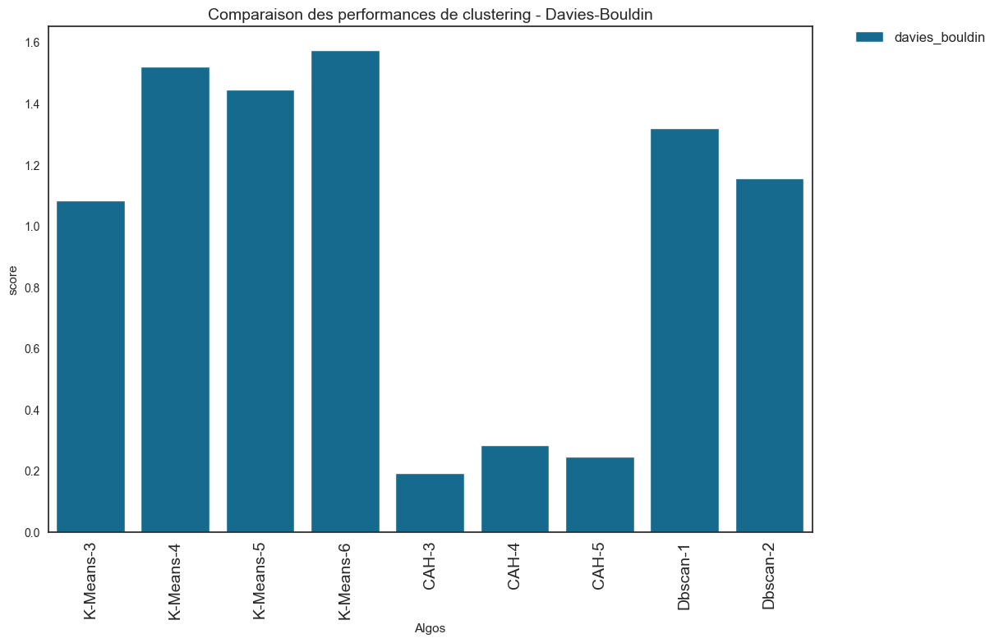

In [127]:
# Visualisation de l'indice Davies-Bouldin
# ---------------------------------------------------------------------
# Comparaison visuelle des 3 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['davies_bouldin'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Davies-Bouldin',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

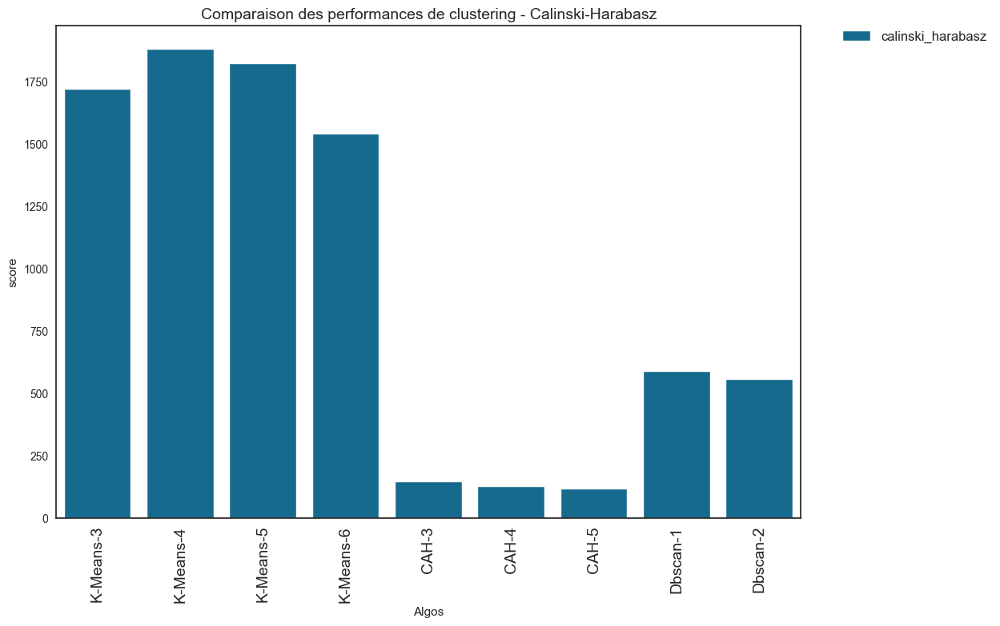

In [128]:
# Visualisation de l'indice Calinski Harabasz
# ---------------------------------------------------------------------
# Comparaison visuelle des 3 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['calinski_harabasz'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Calinski-Harabasz',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

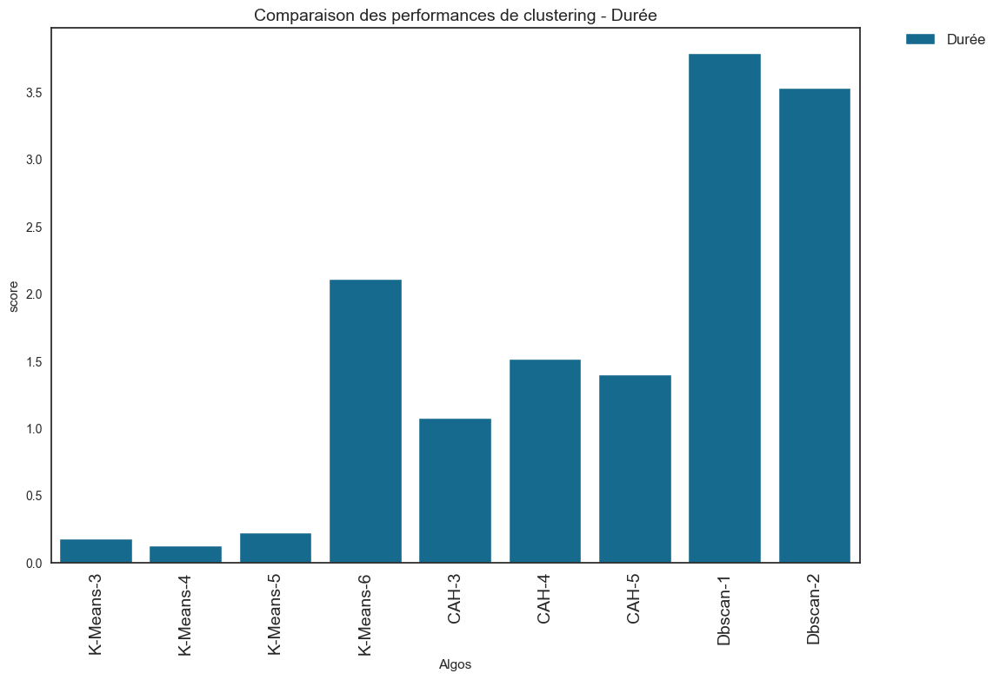

In [129]:
# Visualisation de la durée entraînement + prédiction
# ---------------------------------------------------------------------
# Comparaison visuelle des 3 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['Durée'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Durée',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Si on retire les algorithmes ne pouvant sélectionner qu'un seul ou deux clusters donc inutiles (CAH et DBSCAN), les durées (la plus basse possible), sont favorables pour l' algorithme **K-Means** 

**Bilan** :
***
- la comparaison des résultats des performances permet d'envisager pour la segmentation de clientèle, l'utilisation de l' algorithme **KMeans** (DBCSAN est plus difficile à paramétrer et plus long).